#  COMPLETELY SOMETHING ELSE 

In [9]:
import pandas as pd
import numpy as np

# Assuming your data is loaded into a pandas dataframe called 'data'

data = pd.read_csv('reanalysis.csv')
# 1. Data Shape
print("Data Shape:", data.shape)  # This will print the number of rows and columns

# 2. Features
print("Number of Features:", len(data.columns))
print("Feature Names:", list(data.columns))  # This will print a list of column names

# 3. Feature Types
print("Data Types:")
print(data.dtypes)  # This will display the data type for each column

# 4. Unique Values
print("Number of Unique Values for each Feature:")
for col in data.columns:
  print(col, ":", data[col].nunique())  # This iterates through columns and prints nunique values

# 5. Descriptive Statistics (for numerical features)
print("Descriptive Statistics (for numerical features):")
numerical_features = data.select_dtypes(include=[np.number])  # Select numerical columns
print(numerical_features.describe())  # This provides summary statistics


Data Shape: (266814, 9)
Number of Features: 9
Feature Names: ['longitude', 'latitude', 'level', 'time', 'geopotential', 'specific_humidity', 'air_temperature', 'eastward_wind', 'northward_wind']
Data Types:
longitude            float64
latitude             float64
level                  int64
time                  object
geopotential         float64
specific_humidity    float64
air_temperature      float64
eastward_wind        float64
northward_wind       float64
dtype: object
Number of Unique Values for each Feature:
longitude : 9
latitude : 9
level : 27
time : 122
geopotential : 22874
specific_humidity : 53513
air_temperature : 57848
eastward_wind : 38206
northward_wind : 34265
Descriptive Statistics (for numerical features):
           longitude       latitude          level   geopotential  \
count  266814.000000  266814.000000  266814.000000  266814.000000   
mean       88.500000      22.500000     568.518519   59109.760040   
std         0.645498       0.645498     297.878282   50

In [10]:

# Assuming data['time'] is a column containing datetime strings in the format 'YYYY-MM-DD'
data['time'] = pd.to_datetime(data['time'], format='%Y-%m-%d')

# Convert datetime objects back to strings in the desired format 'd-m-y'
data['time'] = data['time'].dt.strftime('%d-%m-%Y')


In [11]:
data['time'] = pd.to_datetime(data['time'])

# Select features for aggregation
features_to_aggregate = ['geopotential', 'specific_humidity', 'air_temperature', 'eastward_wind', 'northward_wind']

# Group data by date and pressure level
daily_data = data.groupby([pd.Grouper(key='time', freq='D'), 'level'])[features_to_aggregate].mean().reset_index()

# Print the first few rows of the aggregated data
print("Daily aggregated data by date and pressure level (head):")
print(daily_data.tail())

Daily aggregated data by date and pressure level (head):
           time  level  geopotential  specific_humidity  air_temperature  \
3289 2015-12-06    900   9347.179080           0.015691       296.308355   
3290 2015-12-06    925   6990.309800           0.017248       297.036024   
3291 2015-12-06    950   4689.491706           0.018875       297.537090   
3292 2015-12-06    975   2441.828996           0.019924       298.432829   
3293 2015-12-06   1000    240.689430           0.020574       300.142329   

      eastward_wind  northward_wind  
3289       6.515444        2.994220  
3290       6.466312        3.842191  
3291       5.339889        5.084171  
3292       3.443376        5.493134  
3293       1.287169        2.733529  


C:\Users\djadh\AppData\Local\Temp\ipykernel_15540\3720722408.py:1: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  data['time'] = pd.to_datetime(data['time'])


In [13]:
print("Data Shape:", data.shape)  # This will print the number of rows and columns

# 2. Features
print("Number of Features:", len(daily_data.columns))
print("Feature Names:", list(daily_data.columns))  # This will print a list of column names

# 3. Feature Types
print("Data Types:")
print(daily_data.dtypes)  # This will display the data type for each column

# 4. Unique Values
print("Number of Unique Values for each Feature:")
for col in daily_data.columns:
  print(col, ":", daily_data[col].nunique())  # This iterates through columns and prints nunique values

# 5. Descriptive Statistics (for numerical features)
print("Descriptive Statistics (for numerical features):")
numerical_features = daily_data.select_dtypes(include=[np.number])  # Select numerical columns
print(numerical_features.describe())  # This provides summary statistics


Data Shape: (266814, 9)
Number of Features: 7
Feature Names: ['time', 'level', 'geopotential', 'specific_humidity', 'air_temperature', 'eastward_wind', 'northward_wind']
Data Types:
time                 datetime64[ns]
level                         int64
geopotential                float64
specific_humidity           float64
air_temperature             float64
eastward_wind               float64
northward_wind              float64
dtype: object
Number of Unique Values for each Feature:
time : 122
level : 27
geopotential : 3294
specific_humidity : 3267
air_temperature : 3294
eastward_wind : 3294
northward_wind : 3294
Descriptive Statistics (for numerical features):
             level   geopotential  specific_humidity  air_temperature  \
count  3294.000000    3294.000000        3294.000000      3294.000000   
mean    568.518519   59109.760040           0.005849       263.717218   
std     297.922950   50281.592859           0.006339        33.015113   
min     100.000000    -499.314139   

In [14]:
# Save the aggregated data to a CSV file
daily_data.to_csv('aggregated_data.csv', index=False)


In [16]:
import pandas as pd

# Assuming your data is loaded in the 'data' dataframe

# Select features for aggregation
features_to_aggregate = ['geopotential', 'specific_humidity', 'air_temperature', 'eastward_wind', 'northward_wind']

# Group data by date and pressure level, calculate daily mean
daily_data = data.groupby([pd.Grouper(key='time', freq='D'), 'level'])[features_to_aggregate].mean().reset_index()

# Print the first few rows of the aggregated data
print("Daily aggregated data by date and pressure level (head):")
print(daily_data.head())


Daily aggregated data by date and pressure level (head):
        time  level   geopotential  specific_humidity  air_temperature  \
0 2015-01-03    100  161577.207284           0.000002       195.307791   
1 2015-01-03    125  148972.548272           0.000003       199.213226   
2 2015-01-03    150  138307.393457           0.000004       208.833043   
3 2015-01-03    175  128908.655778           0.000007       215.120256   
4 2015-01-03    200  120579.912086           0.000019       219.373154   

   eastward_wind  northward_wind  
0      26.290013       14.805210  
1      33.591683       16.465760  
2      30.730895       18.425666  
3      41.601315        8.236912  
4      39.974280       10.737076  


In [17]:
import pandas as pd

# Assuming your data is loaded in the 'data' dataframe

# Select features for aggregation
features_to_aggregate = ['geopotential', 'specific_humidity', 'air_temperature', 'eastward_wind', 'northward_wind']

# Group data by date and pressure level, calculate daily mean
daily_data = data.groupby([pd.Grouper(key='time', freq='D'), 'level'])[features_to_aggregate].mean().reset_index()

# Reshape to single row per date with pressure level information
reshaped_data = daily_data.pivot_table(index='time', columns='level', values=features_to_aggregate)

# Print the first few rows of the reshaped data
print("Reshaped data (head):")
print(reshaped_data.head())


Reshaped data (head):
           air_temperature                                                  \
level                 100         125         150         175         200    
time                                                                         
2015-01-03      195.307791  199.213226  208.833043  215.120256  219.373154   
2015-01-04      201.408420  204.827548  210.190502  215.654868  220.248383   
2015-01-05      193.743934  200.589170  207.667270  214.777283  220.622180   
2015-01-06      194.129284  201.367850  209.062833  217.020587  223.742788   
2015-02-03      194.534516  199.680128  206.798034  215.111448  219.863884   

                                                                        ...  \
level             225         250         300         350         400   ...   
time                                                                    ...   
2015-01-03  222.809156  227.951935  238.371252  246.852544  253.273669  ...   
2015-01-04  225.683341  231.599720  2

In [18]:
# Assuming 'daily_data' is your reshaped dataframe

# Transpose the dataframe
transposed_data = daily_data.T

# Rename the index (optional)
transposed_data.index.name = 'date'  # Set 'date' as the index name

# Print the first few rows of the transposed data
print("Transposed data (head):")
print(transposed_data.head())


Transposed data (head):
                                  0                    1     \
date                                                          
time               2015-01-03 00:00:00  2015-01-03 00:00:00   
level                              100                  125   
geopotential             161577.207284        148972.548272   
specific_humidity             0.000002             0.000003   
air_temperature             195.307791           199.213226   

                                  2                    3     \
date                                                          
time               2015-01-03 00:00:00  2015-01-03 00:00:00   
level                              150                  175   
geopotential             138307.393457        128908.655778   
specific_humidity             0.000004             0.000007   
air_temperature             208.833043           215.120256   

                                  4                    5     \
date                         

In [19]:
import pandas as pd

# Assuming 'transposed_data' is your transposed dataframe

# Select a subset of features (modify as needed)
selected_features = ['geopotential', 'air_temperature', 'specific_humidity']

# Group by date and calculate mean for selected features
aggregated_data = transposed_data[selected_features].groupby(level='time').mean().reset_index()

# Print the first few rows of the aggregated data
print("Aggregated reanalysis data (head):")
print(aggregated_data.head())


KeyError: "None of [Index(['geopotential', 'air_temperature', 'specific_humidity'], dtype='object')] are in the [columns]"

# only new from gpt chat

In [8]:
import pandas as pd

# Step 1: Read the CSV file
df = pd.read_csv("reanalysis.csv")

# Step 2: Group by 'time' and 'level'
grouped_data = df.groupby(['time', 'level'])

# Step 3: Aggregate values for each feature across pressure levels and dates
aggregated_data = grouped_data.agg({
    'longitude': 'mean',
    'latitude': 'mean',
    'geopotential': ['mean', 'std'],
    'specific_humidity': ['mean', 'std'],
    'air_temperature': ['mean', 'std'],
    'eastward_wind': ['mean', 'std'],
    'northward_wind': ['mean', 'std']
})

# Step 4: Flatten the multi-level column index
aggregated_data.columns = ['_'.join(col).strip() for col in aggregated_data.columns.values]

# Step 5: Reset index to make the grouped keys ('time' and 'level') as columns
aggregated_data.reset_index(inplace=True)

# Step 6: Group by 'time' to calculate daily aggregates
daily_aggregated_data = aggregated_data.groupby('time').agg({
    'longitude_mean': 'mean',
    'latitude_mean': 'mean',
    'geopotential_mean': 'mean',
    'geopotential_std': 'mean',
    'specific_humidity_mean': 'mean',
    'specific_humidity_std': 'mean',
    'air_temperature_mean': 'mean',
    'air_temperature_std': 'mean',
    'eastward_wind_mean': 'mean',
    'eastward_wind_std': 'mean',
    'northward_wind_mean': 'mean',
    'northward_wind_std': 'mean'
}).reset_index()  # Reset index to retain 'time' column

# Step 7: Optionally, rename columns for clarity
daily_aggregated_data.columns = ['time', 'longitude', 'latitude', 'geopotential_mean', 'geopotential_std',
                                 'specific_humidity_mean', 'specific_humidity_std',
                                 'air_temperature_mean', 'air_temperature_std',
                                 'eastward_wind_mean', 'eastward_wind_std',
                                 'northward_wind_mean', 'northward_wind_std']

# Step 8: Display the resulting dataframe
print(daily_aggregated_data)


           time  longitude  latitude  geopotential_mean  geopotential_std  \
0    2015-03-01       88.5      22.5       58912.677054         69.481821   
1    2015-03-02       88.5      22.5       58980.960619         66.723626   
2    2015-03-03       88.5      22.5       58895.835006         77.473579   
3    2015-03-04       88.5      22.5       58686.772505         86.361308   
4    2015-03-05       88.5      22.5       58868.955673         68.979486   
..          ...        ...       ...                ...               ...   
117  2015-06-26       88.5      22.5       58875.591787         46.713287   
118  2015-06-27       88.5      22.5       58889.236771         79.527051   
119  2015-06-28       88.5      22.5       59375.306574         54.716668   
120  2015-06-29       88.5      22.5       59594.115815         36.477536   
121  2015-06-30       88.5      22.5       59482.612683         42.190008   

     specific_humidity_mean  specific_humidity_std  air_temperature_mean  \

In [9]:
daily_aggregated_data.to_csv("reana2.csv", index=False)


Converting both csvs into dd mm yyyy format

In [12]:
import pandas as pd

# Read the CSV file into a DataFrame
df = pd.read_csv("reana2.csv")

# Convert the date column to datetime format
df['time'] = pd.to_datetime(df['time'])

# Convert the datetime column to the desired format (dd mm yyyy)
df['time'] = df['time'].dt.strftime('%d/%m/%Y')

# Save the DataFrame back to a CSV file
df.to_csv("reaanna_ready2join.csv", index=False)


In [3]:
import pandas as pd

# Read the CSV file into a DataFrame
df = pd.read_csv("kolkata_occurrences.csv")

# Combine year, month, and day columns into a single datetime column
df['Date'] = pd.to_datetime(df[['YEAR', 'MONTH', 'DAY']])

# Convert the datetime column to the desired format (dd//mm/yyyy)
df['Date'] = df['Date'].dt.strftime('%d/%m/%Y')

# Drop the original year, month, and day columns if needed
df.drop(columns=['YEAR', 'MONTH', 'DAY'], inplace=True)

# Save the DataFrame back to a CSV file
df.to_csv("th.csv", index=False)


In [17]:
# Step 1: Read the thunderstorm occurrences CSV
thunderstorm_df = pd.read_csv("th.csv")

# Step 2: Convert the 'date' column to datetime format if it's not already
thunderstorm_df['Date'] = pd.to_datetime(thunderstorm_df['Date'])

# Step 3: Read the weather data CSV
weather_df = pd.read_csv("reaanna_ready2join.csv")

# Step 4: Convert the 'time' column to datetime format if it's not already
weather_df['time'] = pd.to_datetime(weather_df['time'])

# Step 5: Perform inner join on 'date' column
merged_df = pd.merge(weather_df, thunderstorm_df, left_on='time', right_on='Date', how='inner')

# Step 6: Drop the redundant 'date' column
merged_df.drop(columns=['Date'], inplace=True)

# Step 7: Display the resulting dataframe
print(merged_df)




          time  longitude  latitude  geopotential_mean  geopotential_std  \
0   2015-01-03       88.5      22.5       58912.677054         69.481821   
1   2015-02-03       88.5      22.5       58980.960619         66.723626   
2   2015-03-03       88.5      22.5       58895.835006         77.473579   
3   2015-04-03       88.5      22.5       58686.772505         86.361308   
4   2015-05-03       88.5      22.5       58868.955673         68.979486   
..         ...        ...       ...                ...               ...   
117 2015-06-26       88.5      22.5       58875.591787         46.713287   
118 2015-06-27       88.5      22.5       58889.236771         79.527051   
119 2015-06-28       88.5      22.5       59375.306574         54.716668   
120 2015-06-29       88.5      22.5       59594.115815         36.477536   
121 2015-06-30       88.5      22.5       59482.612683         42.190008   

     specific_humidity_mean  specific_humidity_std  air_temperature_mean  \
0          

C:\Users\djadh\AppData\Local\Temp\ipykernel_14404\928515778.py:5: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  thunderstorm_df['Date'] = pd.to_datetime(thunderstorm_df['Date'])
C:\Users\djadh\AppData\Local\Temp\ipykernel_14404\928515778.py:11: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  weather_df['time'] = pd.to_datetime(weather_df['time'])


In [ ]:

merged_df.to_csv("daily_aggregates.csv", index=False)

# USE PRA ENV

In [1]:
45

45

In [ ]:
!pip install netcdf

In [2]:
import netCDF4 as nc
import numpy as np
import pandas as pd
print("all lib are loaded")

ModuleNotFoundError: No module named 'netCDF4'

In [ ]:
df = nc.Dataset('reanalysis.nc')

In [ ]:
print(df)

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF3_64BIT_OFFSET data model, file format NETCDF3):
    Conventions: CF-1.6
    history: 2024-02-28 14:57:10 GMT by grib_to_netcdf-2.25.1: /opt/ecmwf/mars-client/bin/grib_to_netcdf.bin -S param -o /cache/data2/adaptor.mars.internal-1709132203.204922-3085-1-7d460dd7-0a58-49d2-a5ce-3ef6a4c1aa09.nc /cache/tmp/7d460dd7-0a58-49d2-a5ce-3ef6a4c1aa09-adaptor.mars.internal-1709130936.267606-3085-1-tmp.grib
    dimensions(sizes): longitude(9), latitude(9), level(27), time(122)
    variables(dimensions): float32 longitude(longitude), float32 latitude(latitude), int32 level(level), int32 time(time), int16 z(time, level, latitude, longitude), int16 r(time, level, latitude, longitude), int16 t(time, level, latitude, longitude), int16 u(time, level, latitude, longitude), int16 v(time, level, latitude, longitude)
    groups: 


In [ ]:
print(df.variables)

{'longitude': <class 'netCDF4._netCDF4.Variable'>
float32 longitude(longitude)
    units: degrees_east
    long_name: longitude
unlimited dimensions: 
current shape = (9,)
filling on, default _FillValue of 9.969209968386869e+36 used, 'latitude': <class 'netCDF4._netCDF4.Variable'>
float32 latitude(latitude)
    units: degrees_north
    long_name: latitude
unlimited dimensions: 
current shape = (9,)
filling on, default _FillValue of 9.969209968386869e+36 used, 'level': <class 'netCDF4._netCDF4.Variable'>
int32 level(level)
    units: millibars
    long_name: pressure_level
unlimited dimensions: 
current shape = (27,)
filling on, default _FillValue of -2147483647 used, 'time': <class 'netCDF4._netCDF4.Variable'>
int32 time(time)
    units: hours since 1900-01-01 00:00:00.0
    long_name: time
    calendar: gregorian
unlimited dimensions: 
current shape = (122,)
filling on, default _FillValue of -2147483647 used, 'z': <class 'netCDF4._netCDF4.Variable'>
int16 z(time, level, latitude, long

In [ ]:
df.dimensions

{'longitude': <class 'netCDF4._netCDF4.Dimension'>: name = 'longitude', size = 9,
 'latitude': <class 'netCDF4._netCDF4.Dimension'>: name = 'latitude', size = 9,
 'level': <class 'netCDF4._netCDF4.Dimension'>: name = 'level', size = 27,
 'time': <class 'netCDF4._netCDF4.Dimension'>: name = 'time', size = 122}

In [ ]:
temp = df.variables['t']
print(temp.shape)
print(temp)

(122, 27, 9, 9)
<class 'netCDF4._netCDF4.Variable'>
int16 t(time, level, latitude, longitude)
    scale_factor: 0.0017657643564507814
    add_offset: 247.06209776967725
    _FillValue: -32767
    missing_value: -32767
    units: K
    long_name: Temperature
    standard_name: air_temperature
unlimited dimensions: 
current shape = (122, 27, 9, 9)
filling on


In [ ]:
geo = df.variables['z']
print(geo.shape)
print(geo)

(122, 27, 9, 9)
<class 'netCDF4._netCDF4.Variable'>
int16 z(time, level, latitude, longitude)
    scale_factor: 2.522314556692811
    add_offset: 81994.81892084665
    _FillValue: -32767
    missing_value: -32767
    units: m**2 s**-2
    long_name: Geopotential
    standard_name: geopotential
unlimited dimensions: 
current shape = (122, 27, 9, 9)
filling on


In [ ]:
ucmp = df.variables['u']
print(ucmp.shape)
print(ucmp)

(122, 27, 9, 9)
<class 'netCDF4._netCDF4.Variable'>
int16 u(time, level, latitude, longitude)
    scale_factor: 0.001530055380689047
    add_offset: 6.637319383930749
    _FillValue: -32767
    missing_value: -32767
    units: m s**-1
    long_name: U component of wind
    standard_name: eastward_wind
unlimited dimensions: 
current shape = (122, 27, 9, 9)
filling on


In [ ]:
vcmp = df.variables['v']
print(vcmp.shape)
print(vcmp)

(122, 27, 9, 9)
<class 'netCDF4._netCDF4.Variable'>
int16 v(time, level, latitude, longitude)
    scale_factor: 0.0010118833613497922
    add_offset: 4.692922097870106
    _FillValue: -32767
    missing_value: -32767
    units: m s**-1
    long_name: V component of wind
    standard_name: northward_wind
unlimited dimensions: 
current shape = (122, 27, 9, 9)
filling on


In [ ]:
spec_hum = df.variables['q']
print(temp.shape)
print(spec_hum)

In [ ]:
rel_hum = df.variables['q']
print(temp.shape)
print(spec_hum)

(122, 27, 9, 9)
<class 'netCDF4._netCDF4.Variable'>
int16 r(time, level, latitude, longitude)
    scale_factor: 0.0022071275019375377
    add_offset: 70.71379740670801
    _FillValue: -32767
    missing_value: -32767
    units: %
    long_name: Relative humidity
    standard_name: relative_humidity
unlimited dimensions: 
current shape = (122, 27, 9, 9)
filling on


In [11]:
import xarray as xr

ds = xr.open_dataset("/content/reanalysisisisi.nc")
ds

<xarray.Dataset>
Dimensions:    (longitude: 9, latitude: 9, level: 27, time: 122)
Coordinates:
  * longitude  (longitude) float32 87.5 87.75 88.0 88.25 ... 89.0 89.25 89.5
  * latitude   (latitude) float32 23.5 23.25 23.0 22.75 ... 22.0 21.75 21.5
  * level      (level) int32 100 125 150 175 200 225 ... 900 925 950 975 1000
  * time       (time) datetime64[ns] 2015-03-01 2015-03-02 ... 2015-06-30
Data variables:
    z          (time, level, latitude, longitude) float32 ...
    q          (time, level, latitude, longitude) float32 ...
    t          (time, level, latitude, longitude) float32 ...
    u          (time, level, latitude, longitude) float32 ...
    v          (time, level, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2024-02-29 05:48:43 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

In [12]:
ds["z"]

<xarray.DataArray 'z' (time: 122, level: 27, latitude: 9, longitude: 9)>
[266814 values with dtype=float32]
Coordinates:
  * longitude  (longitude) float32 87.5 87.75 88.0 88.25 ... 89.0 89.25 89.5
  * latitude   (latitude) float32 23.5 23.25 23.0 22.75 ... 22.0 21.75 21.5
  * level      (level) int32 100 125 150 175 200 225 ... 900 925 950 975 1000
  * time       (time) datetime64[ns] 2015-03-01 2015-03-02 ... 2015-06-30
Attributes:
    units:          m**2 s**-2
    long_name:      Geopotential
    standard_name:  geopotential

In [13]:
ds["q"]

<xarray.DataArray 'q' (time: 122, level: 27, latitude: 9, longitude: 9)>
[266814 values with dtype=float32]
Coordinates:
  * longitude  (longitude) float32 87.5 87.75 88.0 88.25 ... 89.0 89.25 89.5
  * latitude   (latitude) float32 23.5 23.25 23.0 22.75 ... 22.0 21.75 21.5
  * level      (level) int32 100 125 150 175 200 225 ... 900 925 950 975 1000
  * time       (time) datetime64[ns] 2015-03-01 2015-03-02 ... 2015-06-30
Attributes:
    units:          kg kg**-1
    long_name:      Specific humidity
    standard_name:  specific_humidity

In [15]:
ds["t"]

<xarray.DataArray 't' (time: 122, level: 27, latitude: 9, longitude: 9)>
[266814 values with dtype=float32]
Coordinates:
  * longitude  (longitude) float32 87.5 87.75 88.0 88.25 ... 89.0 89.25 89.5
  * latitude   (latitude) float32 23.5 23.25 23.0 22.75 ... 22.0 21.75 21.5
  * level      (level) int32 100 125 150 175 200 225 ... 900 925 950 975 1000
  * time       (time) datetime64[ns] 2015-03-01 2015-03-02 ... 2015-06-30
Attributes:
    units:          K
    long_name:      Temperature
    standard_name:  air_temperature

In [16]:
ds["u"]

<xarray.DataArray 'u' (time: 122, level: 27, latitude: 9, longitude: 9)>
[266814 values with dtype=float32]
Coordinates:
  * longitude  (longitude) float32 87.5 87.75 88.0 88.25 ... 89.0 89.25 89.5
  * latitude   (latitude) float32 23.5 23.25 23.0 22.75 ... 22.0 21.75 21.5
  * level      (level) int32 100 125 150 175 200 225 ... 900 925 950 975 1000
  * time       (time) datetime64[ns] 2015-03-01 2015-03-02 ... 2015-06-30
Attributes:
    units:          m s**-1
    long_name:      U component of wind
    standard_name:  eastward_wind

In [17]:
ds["v"]

<xarray.DataArray 'v' (time: 122, level: 27, latitude: 9, longitude: 9)>
[266814 values with dtype=float32]
Coordinates:
  * longitude  (longitude) float32 87.5 87.75 88.0 88.25 ... 89.0 89.25 89.5
  * latitude   (latitude) float32 23.5 23.25 23.0 22.75 ... 22.0 21.75 21.5
  * level      (level) int32 100 125 150 175 200 225 ... 900 925 950 975 1000
  * time       (time) datetime64[ns] 2015-03-01 2015-03-02 ... 2015-06-30
Attributes:
    units:          m s**-1
    long_name:      V component of wind
    standard_name:  northward_wind

CHATGPT

In [19]:
import xarray as xr
import pandas as pd

# Load the netCDF data into an xarray dataset
ds = xr.open_dataset('/content/reanalysisisisi.nc')

# Convert xarray dataset to pandas DataFrame
df = ds.to_dataframe().reset_index()

# Display the DataFrame
print(df.head())


   longitude  latitude  level       time              z         q           t  \
0       87.5      23.5    100 2015-03-01  161354.406250  0.000002  198.148666   
1       87.5      23.5    100 2015-03-02  161558.718750  0.000003  195.222794   
2       87.5      23.5    100 2015-03-03  161750.406250  0.000003  193.391693   
3       87.5      23.5    100 2015-03-04  161737.796875  0.000002  193.947906   
4       87.5      23.5    100 2015-03-05  161800.843750  0.000002  195.397614   

           u          v  
0  29.350992  11.406769  
1  24.262028   3.660801  
2  26.431646   1.130081  
3  22.918640  -1.913664  
4  14.185083   1.849530  


In [20]:
total_records = len(df)

# Display the total number of records
print(f"Total number of records in the dataset: {total_records}")

Total number of records in the dataset: 266814


Total slices which can be made

In [ ]:
# Convert the first slice to pandas DataFrame
first_slice = slices[0].to_dataframe().reset_index()

# Rename the columns to match the actual variable names
column_mapping = {
    'geopotential': 'z',
    'specific_humidity': 'q',
    'temperature': 't',
    'u_component_of_wind': 'u',
    'v_component_of_wind': 'v'
}

first_slice.rename(columns=column_mapping, inplace=True)

# Display the first slice DataFrame
print(first_slice.head())

# Perform EDA on the DataFrame
# ... your EDA code here ...


   longitude  latitude  level       time             z         q           t  \
0       60.0      40.0    100 2015-03-01  158600.87500  0.000003  213.238617   
1       60.0      40.0    100 2015-03-02  158221.18750  0.000003  217.556030   
2       60.0      40.0    100 2015-03-03  158028.75000  0.000003  217.018448   
3       60.0      40.0    100 2015-03-04  157571.03125  0.000003  216.932693   
4       60.0      40.0    100 2015-03-05  157295.37500  0.000003  216.512238   

           u         v  
0   7.824395 -7.322860  
1  10.296048 -0.330059  
2  18.361088  0.098188  
3  18.796730  0.286617  
4  17.322767 -0.360512  


# some


In [1]:
import xarray as xr
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Open the netCDF dataset
ds = xr.open_dataset("reanalysis.nc")

# Print the variable names in the dataset
print(ds.variables)


Frozen({'longitude': <xarray.IndexVariable 'longitude' (longitude: 9)>
array([87.5 , 87.75, 88.  , 88.25, 88.5 , 88.75, 89.  , 89.25, 89.5 ],
      dtype=float32)
Attributes:
    units:      degrees_east
    long_name:  longitude, 'latitude': <xarray.IndexVariable 'latitude' (latitude: 9)>
array([23.5 , 23.25, 23.  , 22.75, 22.5 , 22.25, 22.  , 21.75, 21.5 ],
      dtype=float32)
Attributes:
    units:      degrees_north
    long_name:  latitude, 'level': <xarray.IndexVariable 'level' (level: 27)>
array([ 100,  125,  150,  175,  200,  225,  250,  300,  350,  400,  450,  500,
        550,  600,  650,  700,  750,  775,  800,  825,  850,  875,  900,  925,
        950,  975, 1000])
Attributes:
    units:      millibars
    long_name:  pressure_level, 'time': <xarray.IndexVariable 'time' (time: 122)>
array(['2015-03-01T00:00:00.000000000', '2015-03-02T00:00:00.000000000',
       '2015-03-03T00:00:00.000000000', '2015-03-04T00:00:00.000000000',
       '2015-03-05T00:00:00.000000000', '2015-0

In [2]:
import xarray as xr
import pandas as pd

# Open the netCDF dataset
ds = xr.open_dataset("reanalysis.nc")

# Convert xarray dataset to pandas DataFrame
df = ds.to_dataframe()

# Resetting the index to get a flat DataFrame
df.reset_index(inplace=True)

# Display the resulting DataFrame
print(df.head())


   longitude  latitude  level       time              z         q           t  \
0       87.5      23.5    100 2015-03-01  161354.406250  0.000002  198.148666   
1       87.5      23.5    100 2015-03-02  161558.718750  0.000003  195.222794   
2       87.5      23.5    100 2015-03-03  161750.406250  0.000003  193.391693   
3       87.5      23.5    100 2015-03-04  161737.796875  0.000002  193.947906   
4       87.5      23.5    100 2015-03-05  161800.843750  0.000002  195.397614   

           u          v  
0  29.350992  11.406769  
1  24.262028   3.660801  
2  26.431646   1.130081  
3  22.918640  -1.913664  
4  14.185083   1.849530  


In [4]:
# Define the mapping for column renaming
column_mapping = {
    'z': 'geopotential',
    'q': 'specific_humidity',
    't': 'air_temperature',
    'u': 'eastward_wind',
    'v': 'northward_wind'
}

# Rename the columns in the DataFrame
df.rename(columns=column_mapping, inplace=True)

# Display the DataFrame with renamed columns
print(df.head())


   longitude  latitude  level       time   geopotential  specific_humidity  \
0       87.5      23.5    100 2015-03-01  161354.406250           0.000002   
1       87.5      23.5    100 2015-03-02  161558.718750           0.000003   
2       87.5      23.5    100 2015-03-03  161750.406250           0.000003   
3       87.5      23.5    100 2015-03-04  161737.796875           0.000002   
4       87.5      23.5    100 2015-03-05  161800.843750           0.000002   

   air_temperature  eastward_wind  northward_wind  
0       198.148666      29.350992       11.406769  
1       195.222794      24.262028        3.660801  
2       193.391693      26.431646        1.130081  
3       193.947906      22.918640       -1.913664  
4       195.397614      14.185083        1.849530  


EDA

In [5]:
df.shape

(266814, 9)

In [6]:
print(df.describe())


           longitude       latitude          level   geopotential  \
count  266814.000000  266814.000000  266814.000000  266814.000000   
mean       88.500000      22.500000     568.518519   59109.750000   
std         0.645498       0.645498     297.878282   50274.093750   
min        87.500000      21.500000     100.000000    -651.335938   
25%        88.000000      22.000000     250.000000   14768.201172   
50%        88.500000      22.500000     600.000000   43078.027344   
75%        89.000000      23.000000     850.000000  106395.687500   
max        89.500000      23.500000    1000.000000  164643.500000   

       specific_humidity  air_temperature  eastward_wind  northward_wind  
count       2.668140e+05    266814.000000  266814.000000   266814.000000  
mean        5.849363e-03       263.717224       8.619562        2.182431  
std         6.382821e-03        33.014542      11.470066        6.421661  
min         3.511086e-07       189.205078     -43.496475      -28.462446  
25%

In [9]:
df.columns

Index(['longitude', 'latitude', 'level', 'time', 'geopotential',
       'specific_humidity', 'air_temperature', 'eastward_wind',
       'northward_wind'],
      dtype='object')

In [10]:
df.duplicated().sum()

0

In [11]:
df.isnull().sum()

longitude            0
latitude             0
level                0
time                 0
geopotential         0
specific_humidity    0
air_temperature      0
eastward_wind        0
northward_wind       0
dtype: int64

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 266814 entries, 0 to 266813
Data columns (total 9 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   longitude          266814 non-null  float64       
 1   latitude           266814 non-null  float64       
 2   level              266814 non-null  int64         
 3   time               266814 non-null  datetime64[ns]
 4   geopotential       266814 non-null  float32       
 5   specific_humidity  266814 non-null  float32       
 6   air_temperature    266814 non-null  float32       
 7   eastward_wind      266814 non-null  float32       
 8   northward_wind     266814 non-null  float32       
dtypes: datetime64[ns](1), float32(5), float64(2), int64(1)
memory usage: 13.2 MB


In [13]:
df.nunique()

longitude                9
latitude                 9
level                   27
time                   122
geopotential         22874
specific_humidity    53513
air_temperature      57848
eastward_wind        38206
northward_wind       34265
dtype: int64

In [14]:
# Identify datetime columns
datetime_columns = df.select_dtypes(include=['datetime64[ns]']).columns
print("Datetime columns:")
print(datetime_columns)

# Identify numerical columns
numerical_columns = df.select_dtypes(include=['float32', 'float64', 'int64']).columns
print("\nNumerical columns:")
print(numerical_columns)


Datetime columns:
Index(['time'], dtype='object')

Numerical columns:
Index(['longitude', 'latitude', 'level', 'geopotential', 'specific_humidity',
       'air_temperature', 'eastward_wind', 'northward_wind'],
      dtype='object')


In [15]:
def classify_features(df):
    categorical_features = []
    non_categorical_features = []
    discrete_features = []
    continuous_features = []

    for column in df.columns:
        if df[column].dtype in ['datetime64[ns]']:
            non_categorical_features.append(column)
        elif df[column].dtype in ['float32', 'float64']:
            if df[column].nunique() < 15:
                categorical_features.append(column)
            else:
                continuous_features.append(column)
        elif df[column].dtype in ['int64']:
            if df[column].nunique() < 15:
                categorical_features.append(column)
            else:
                discrete_features.append(column)

    return categorical_features, non_categorical_features, discrete_features, continuous_features


In [16]:
categorical, non_categorical, discrete, continuous = classify_features(df)

In [17]:
print("Categorical Features:", categorical)
print("Non-Categorical Features:", non_categorical)
print("Discrete Features:", discrete)
print("Continuous Features:", continuous)

Categorical Features: ['longitude', 'latitude']
Non-Categorical Features: ['time']
Discrete Features: ['level']
Continuous Features: ['geopotential', 'specific_humidity', 'air_temperature', 'eastward_wind', 'northward_wind']


If you plan to use 'longitude' and 'latitude' as factors influencing the target variable and not as specific coordinates, you might treat them as categorical. On the other hand, if you intend to use them for distance calculations or other numerical operations, you may choose to treat them as continuous.

In [18]:
for i in categorical:
    print(i, ':')
    print(df[i].value_counts())
    print()

longitude :
87.50    29646
87.75    29646
88.00    29646
88.25    29646
88.50    29646
88.75    29646
89.00    29646
89.25    29646
89.50    29646
Name: longitude, dtype: int64

latitude :
23.50    29646
23.25    29646
23.00    29646
22.75    29646
22.50    29646
22.25    29646
22.00    29646
21.75    29646
21.50    29646
Name: latitude, dtype: int64



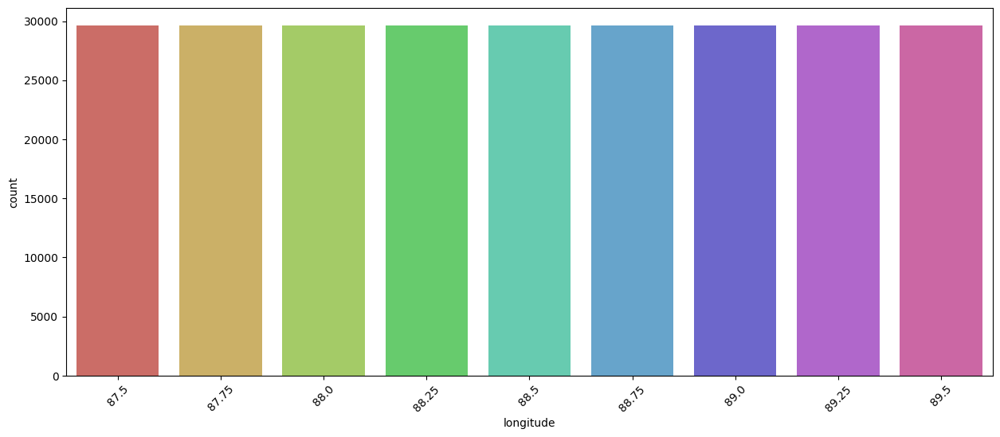

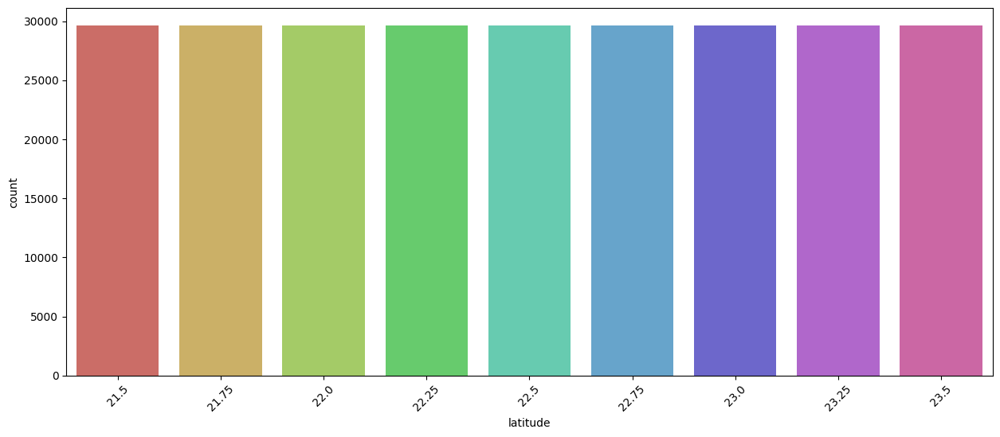

In [37]:
for i in categorical:
    plt.figure(figsize=(15, 6))
    sns.countplot(x=i, data=df, palette='hls')
    plt.xticks(rotation = 45)
    plt.show()

In [20]:
df.shape

(266814, 9)

In [21]:
for i in non_categorical:
    print(i, ':')
    print(df[i].value_counts())
    print()

time :
2015-03-01    2187
2015-05-31    2187
2015-05-29    2187
2015-05-28    2187
2015-05-27    2187
              ... 
2015-04-06    2187
2015-04-05    2187
2015-04-04    2187
2015-04-03    2187
2015-06-30    2187
Name: time, Length: 122, dtype: int64



In [33]:
for i in discrete:
    print(i, ':')
    print(df[i].unique())
    print()

level :
[ 100  125  150  175  200  225  250  300  350  400  450  500  550  600
  650  700  750  775  800  825  850  875  900  925  950  975 1000]



In [26]:
for i in discrete:
    print(i, ':')
    print(df[i].value_counts())
    print()

level :
100     9882
650     9882
975     9882
950     9882
925     9882
900     9882
875     9882
850     9882
825     9882
800     9882
775     9882
750     9882
700     9882
600     9882
125     9882
550     9882
500     9882
450     9882
400     9882
350     9882
300     9882
250     9882
225     9882
200     9882
175     9882
150     9882
1000    9882
Name: level, dtype: int64



In [27]:
for i in continuous:
    print(i, ':')
    print(df[i].value_counts())
    print()

geopotential :
 30784.269531     81
 25172.117188     77
 17247.003906     76
 49981.601562     74
 25169.597656     74
                  ..
 161107.218750     1
 161419.984375     1
-522.703125        1
-103.992188        1
-308.304688        1
Name: geopotential, Length: 22874, dtype: int64

specific_humidity :
0.000002    3516
0.000003    2844
0.000003    2780
0.000003    2630
0.000004    1928
            ... 
0.014907       1
0.020141       1
0.012133       1
0.008121       1
0.020050       1
Name: specific_humidity, Length: 53513, dtype: int64

air_temperature :
297.506470    33
296.614746    32
297.137421    31
296.552948    31
296.715393    30
              ..
264.631470     1
268.110016     1
271.355499     1
267.544983     1
302.139832     1
Name: air_temperature, Length: 57848, dtype: int64

eastward_wind :
 6.124751     46
 5.194477     43
 4.926718     42
 5.494368     42
 4.785953     41
              ..
 42.468155     1
-21.192858     1
-18.152637     1
-6.103452      1
-

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4256989140.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(df[i], bins = 20, kde = True, palette='hls')


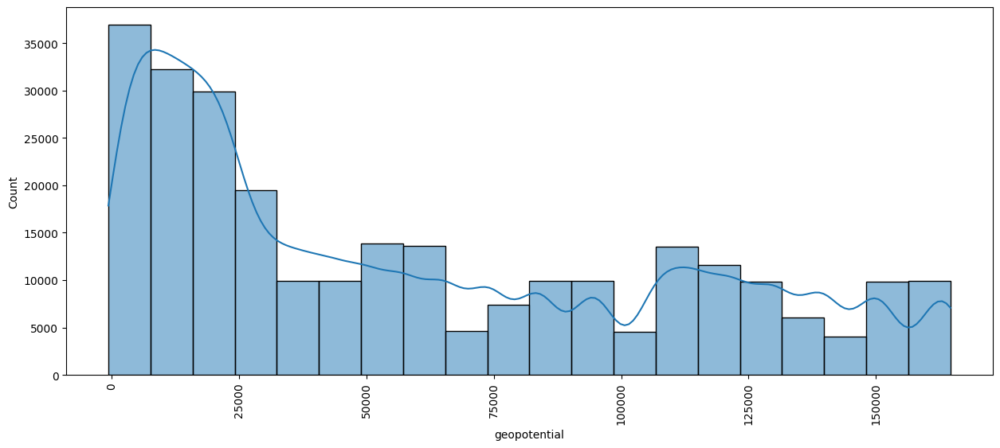

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4256989140.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(df[i], bins = 20, kde = True, palette='hls')


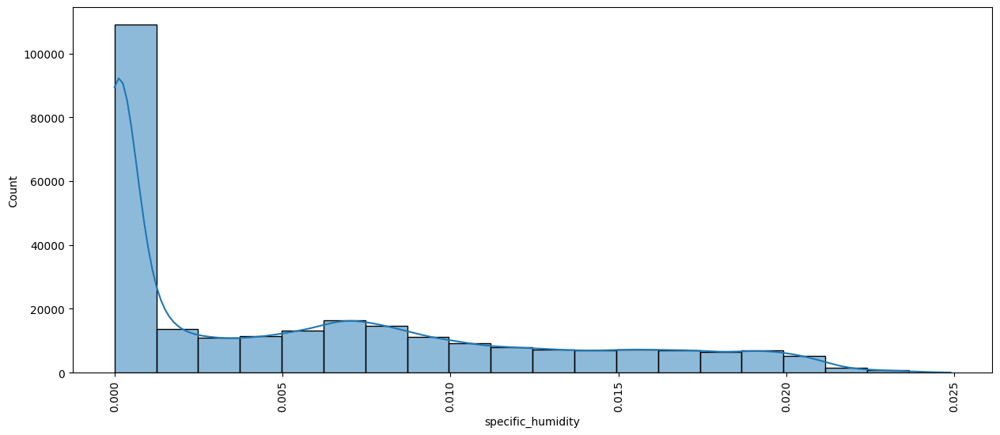

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4256989140.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(df[i], bins = 20, kde = True, palette='hls')


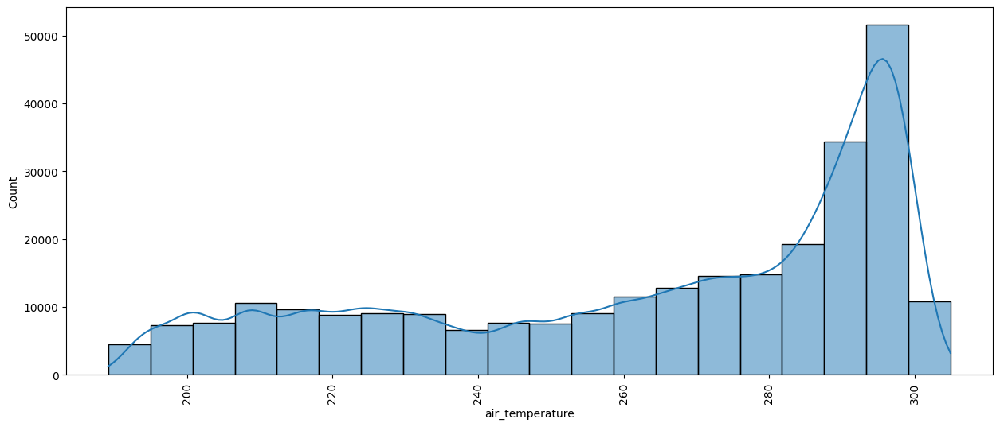

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4256989140.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(df[i], bins = 20, kde = True, palette='hls')


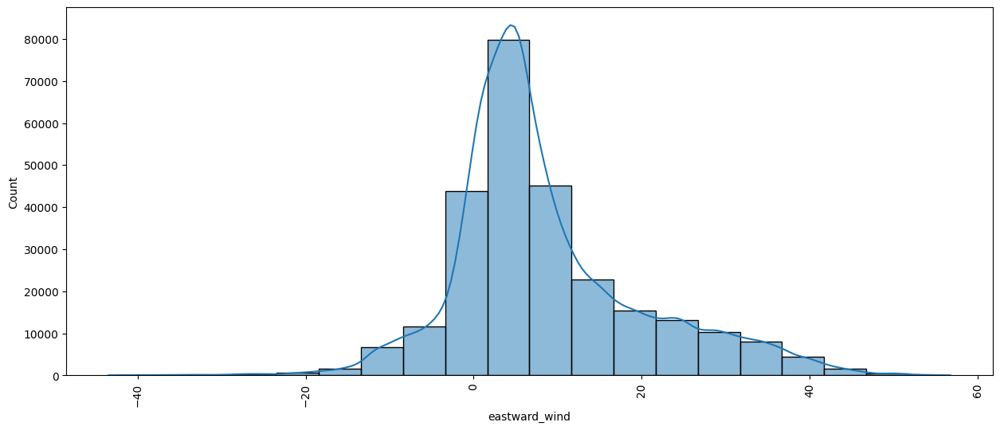

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4256989140.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(df[i], bins = 20, kde = True, palette='hls')


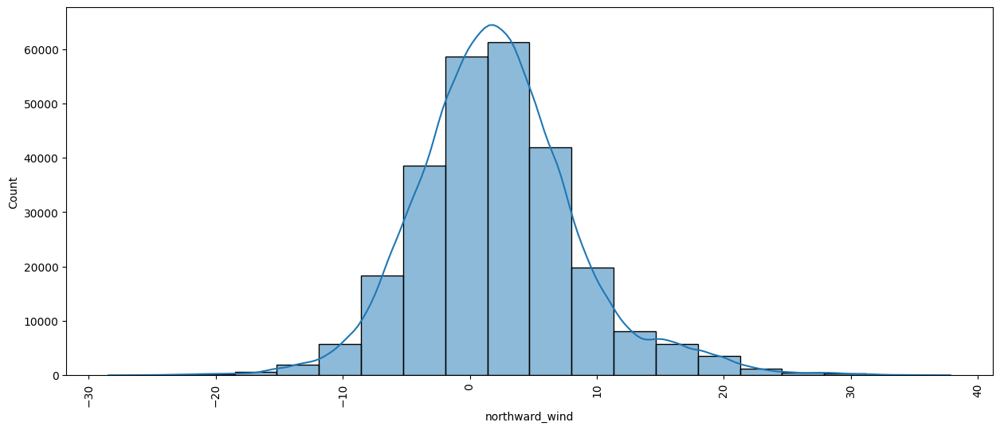

In [38]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.histplot(df[i], bins = 20, kde = True, palette='hls')
    plt.xticks(rotation = 90)
    plt.show()

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\3909953402.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[i], bins = 20, kde = True)


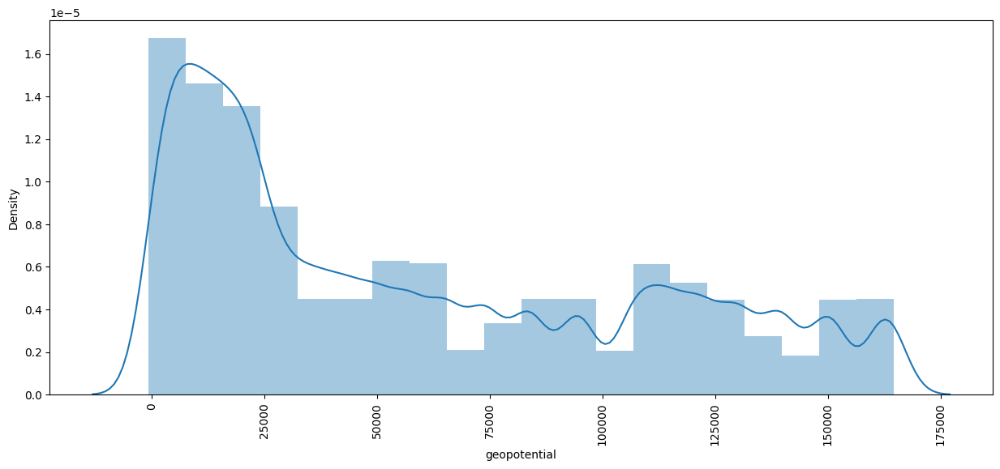

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\3909953402.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[i], bins = 20, kde = True)


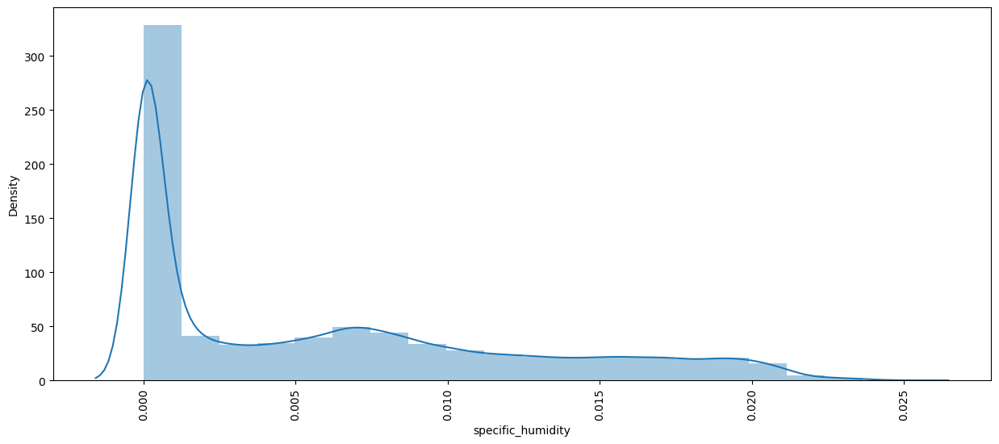

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\3909953402.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[i], bins = 20, kde = True)


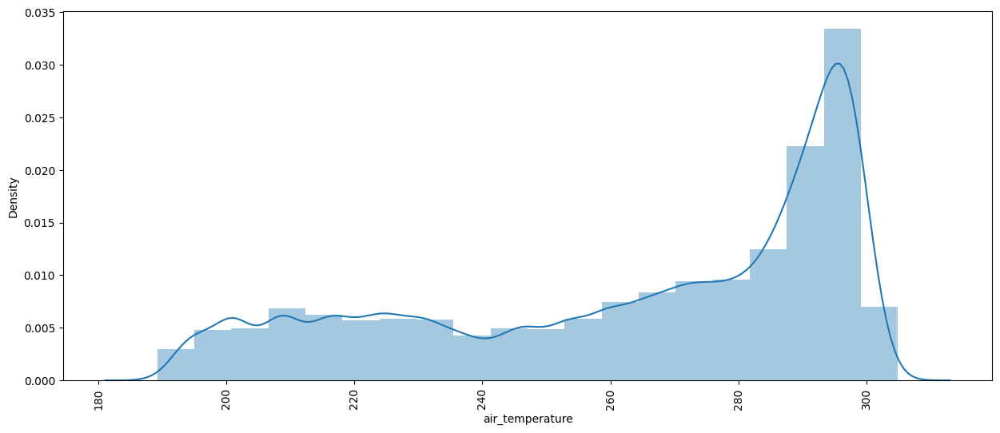

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\3909953402.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[i], bins = 20, kde = True)


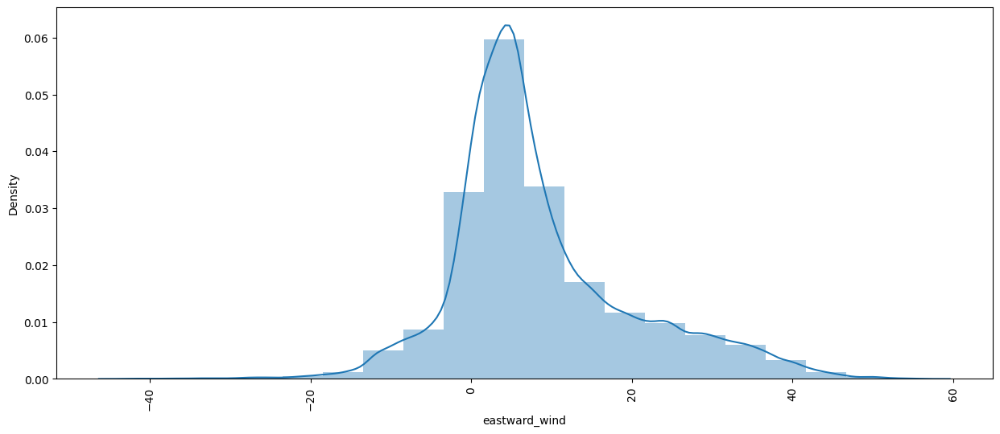

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\3909953402.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[i], bins = 20, kde = True)


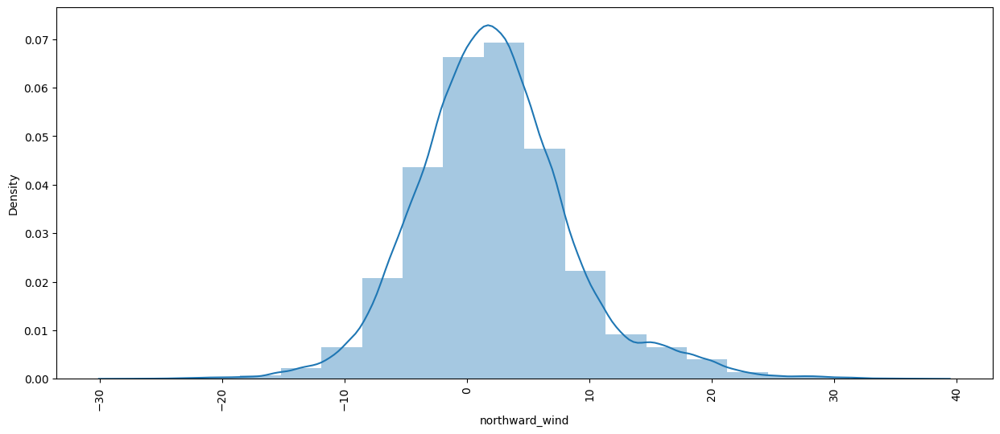

In [39]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.distplot(df[i], bins = 20, kde = True)
    plt.xticks(rotation = 90)
    plt.show()

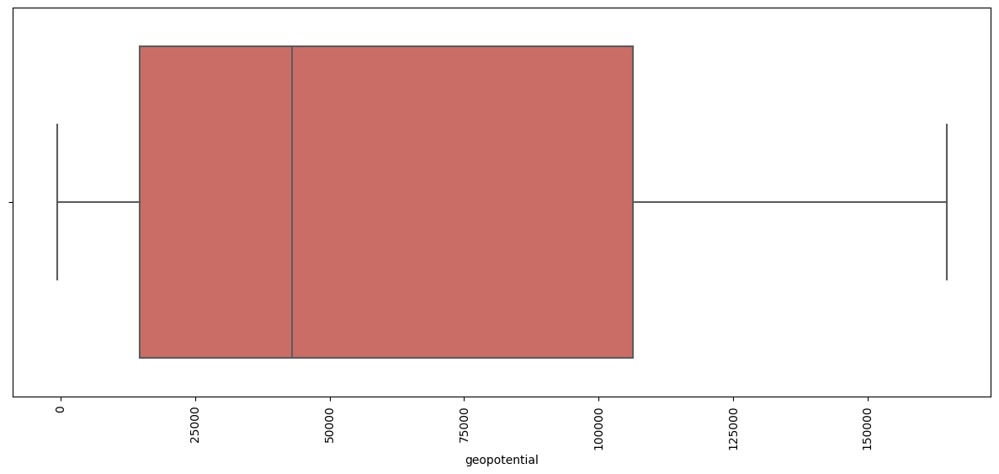

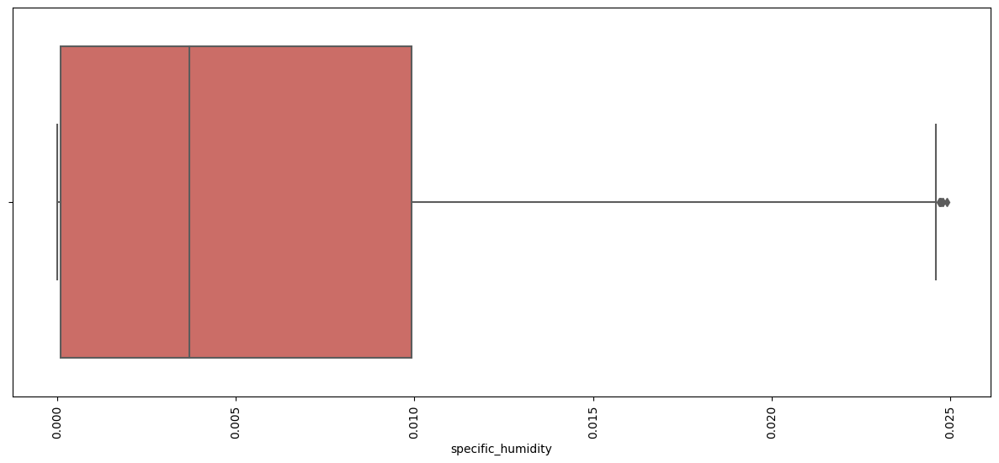

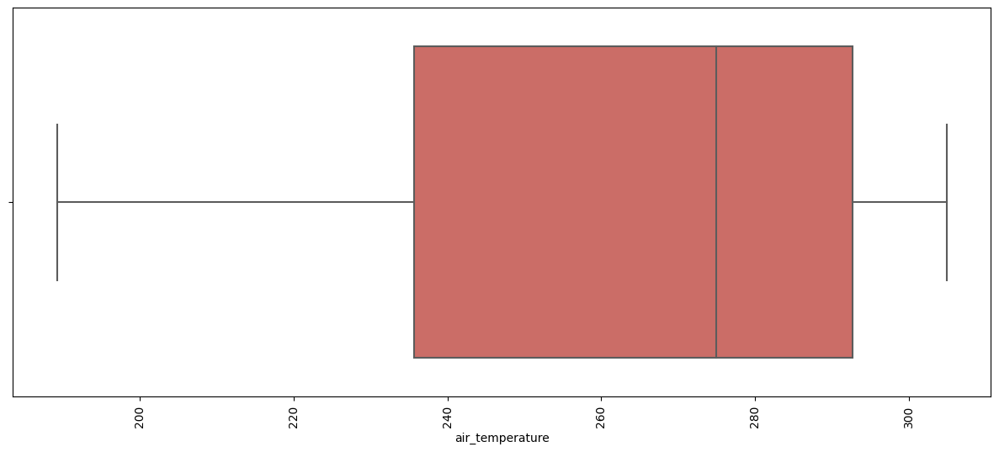

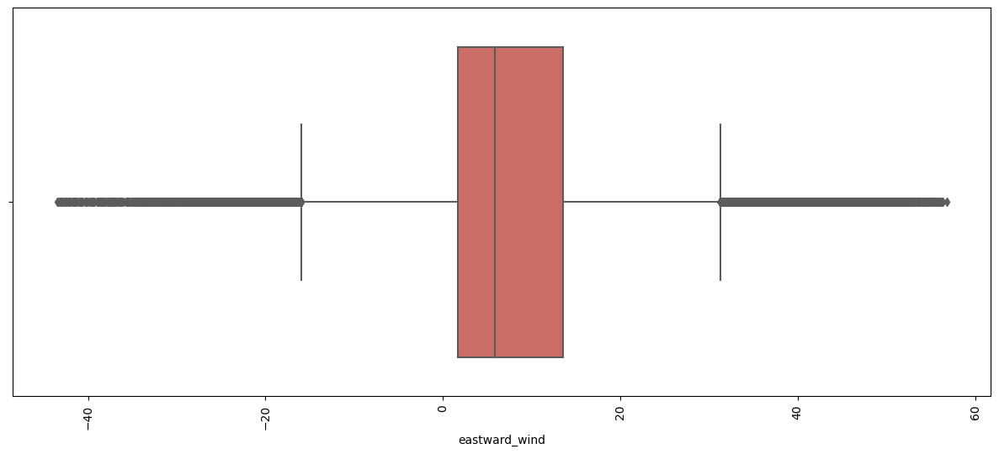

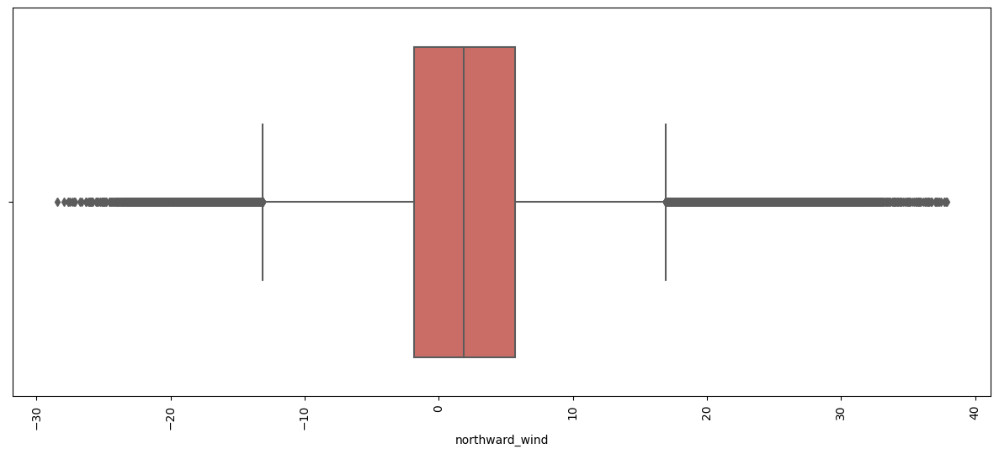

In [41]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.boxplot(x=i, data=df, palette='hls')
    plt.xticks(rotation=90)
    plt.show()


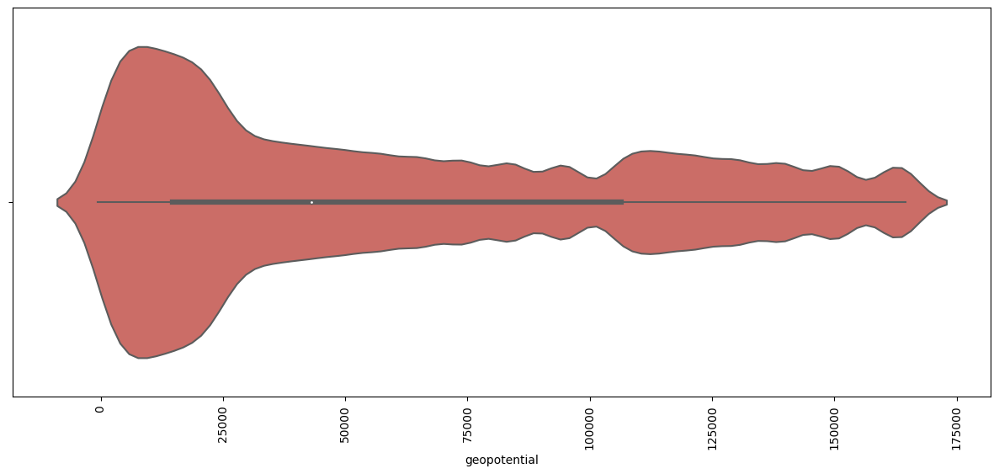

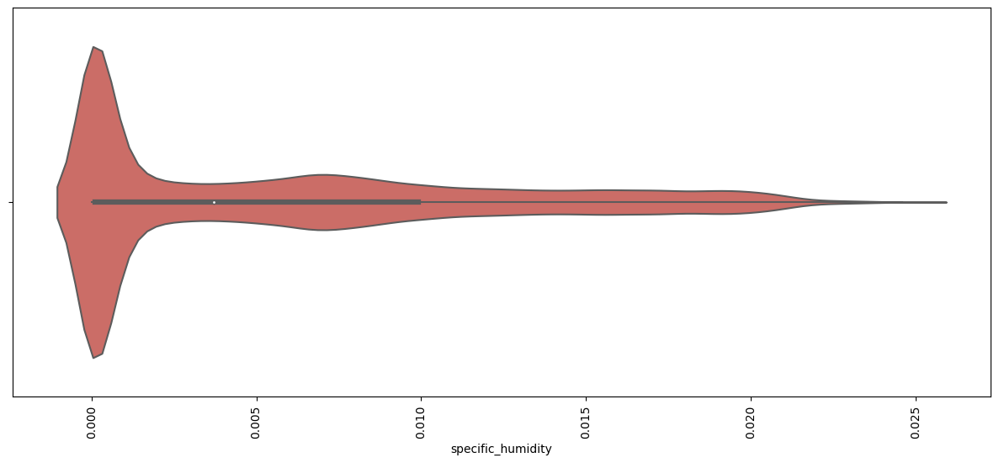

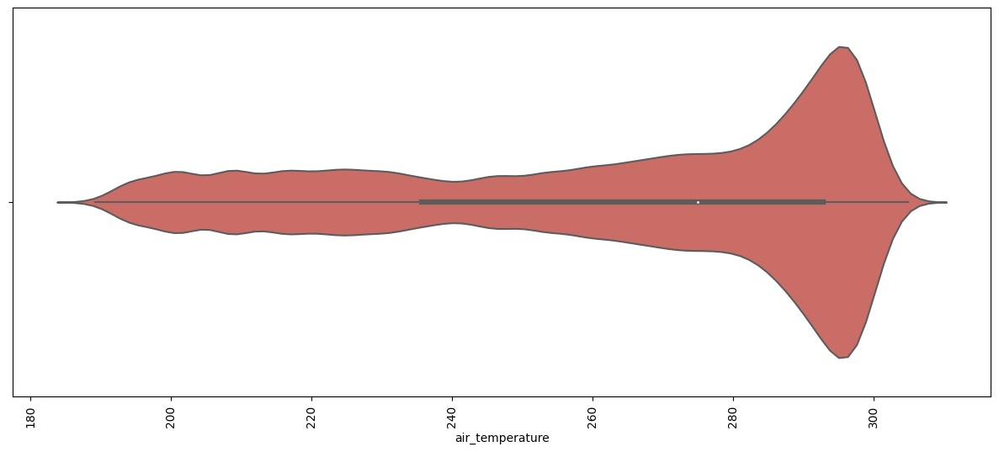

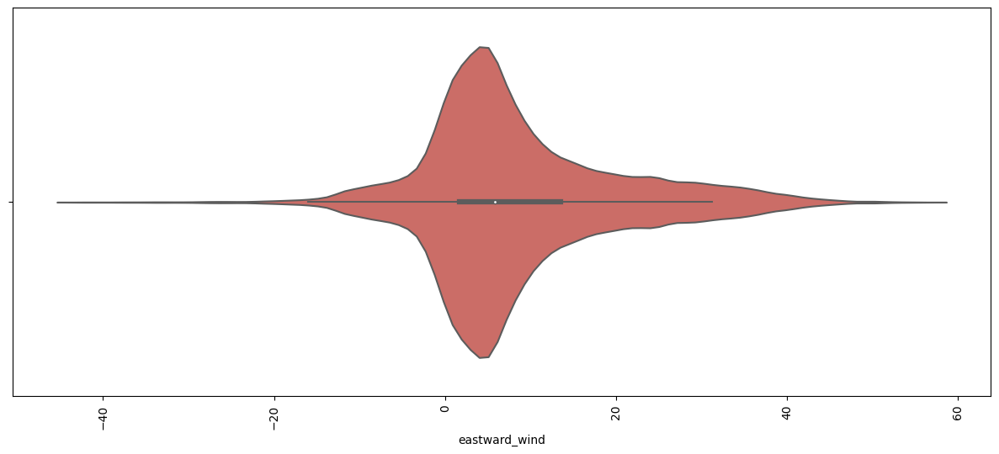

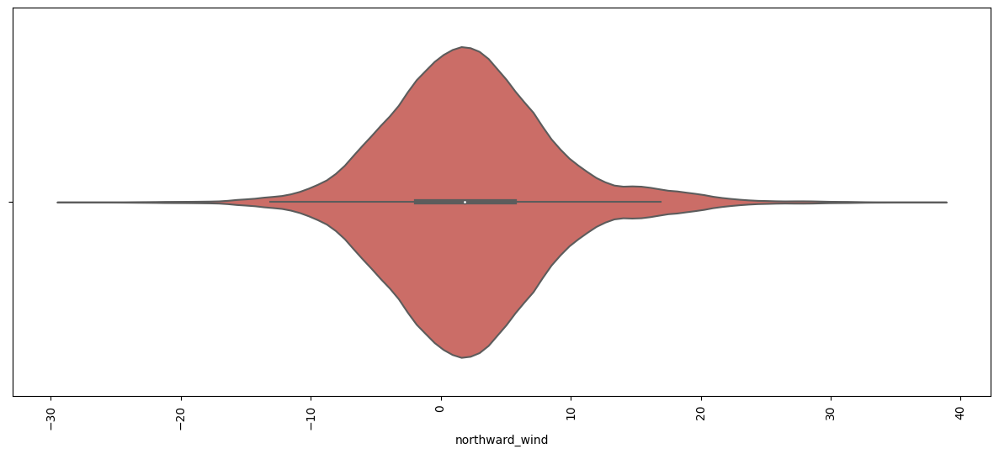

In [42]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.violinplot(x = i, data = df, palette='hls')
    plt.xticks(rotation = 90)
    plt.show()

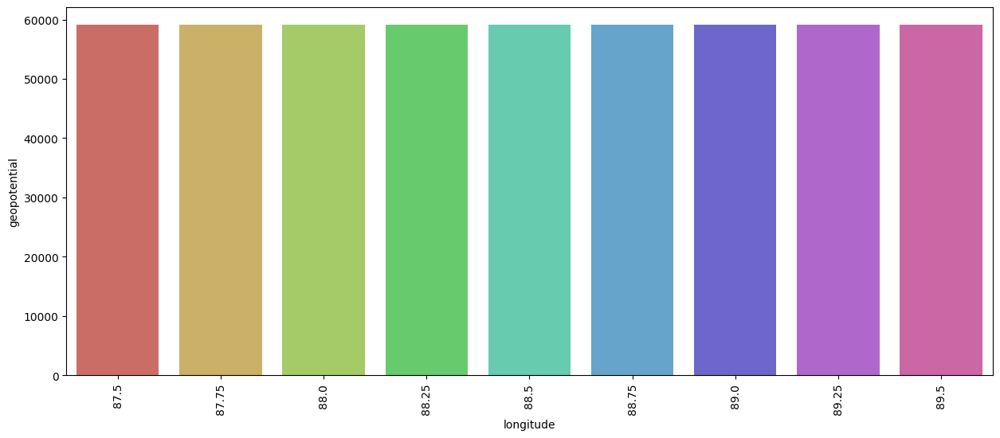

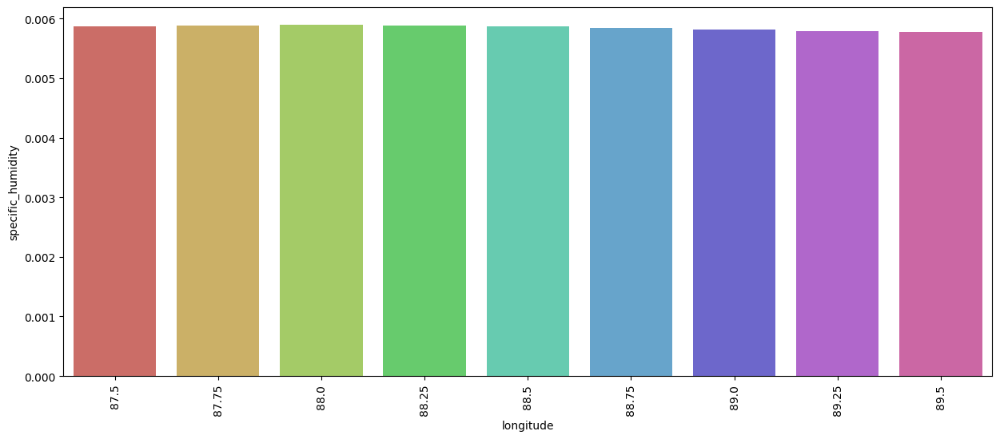

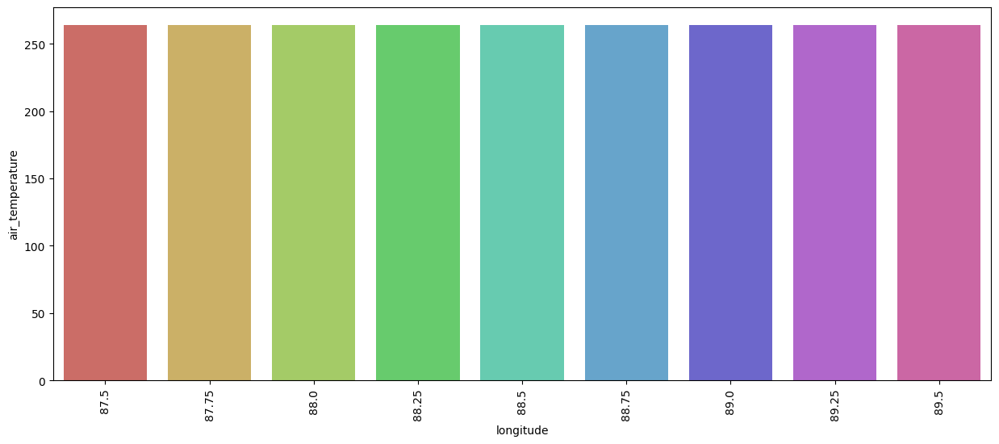

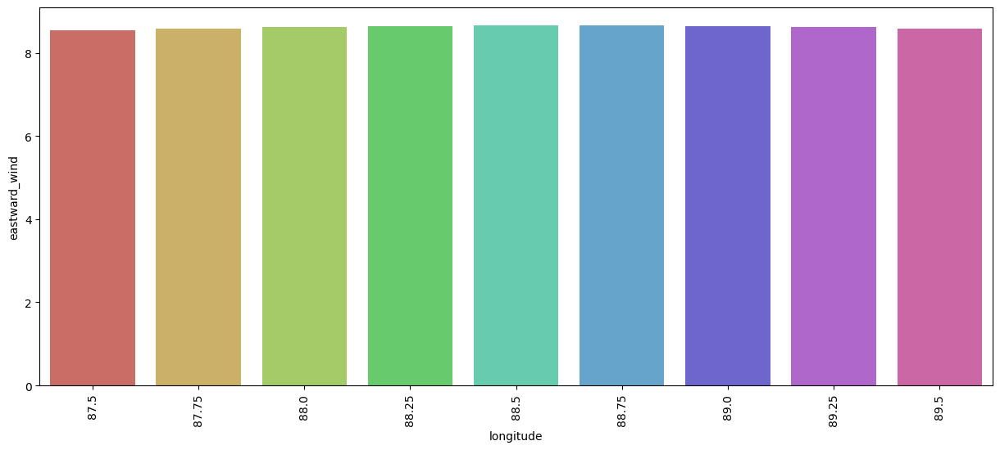

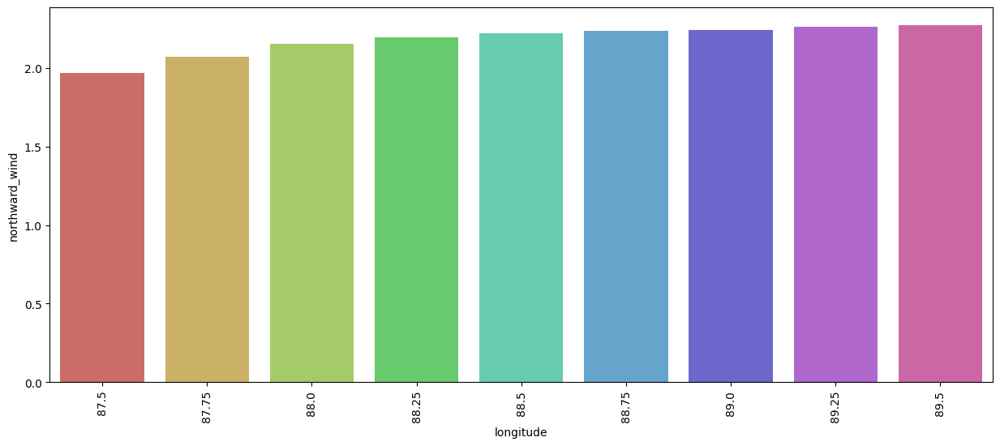

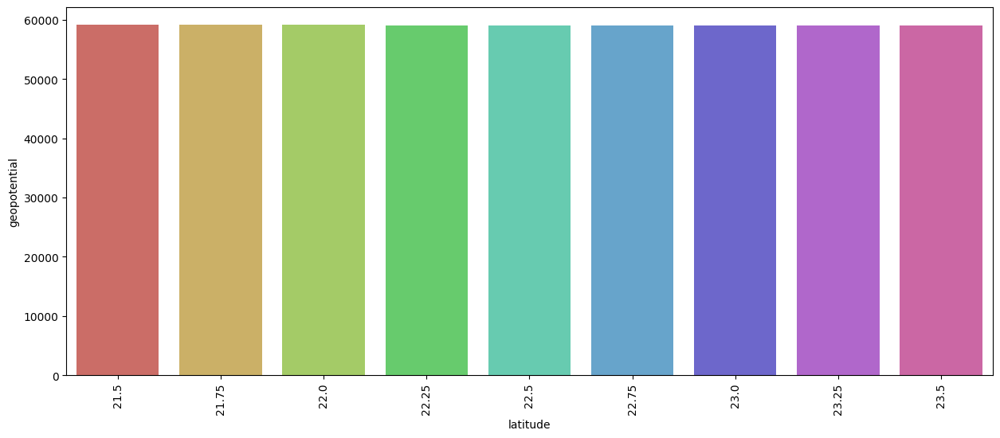

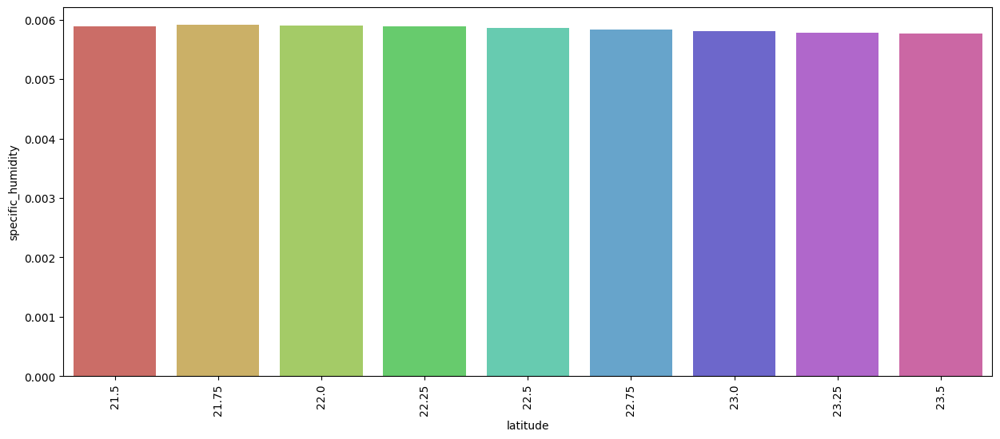

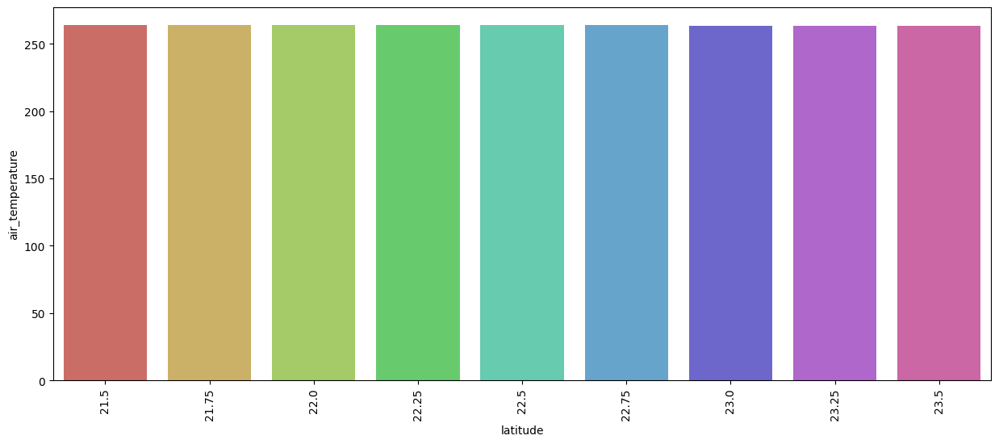

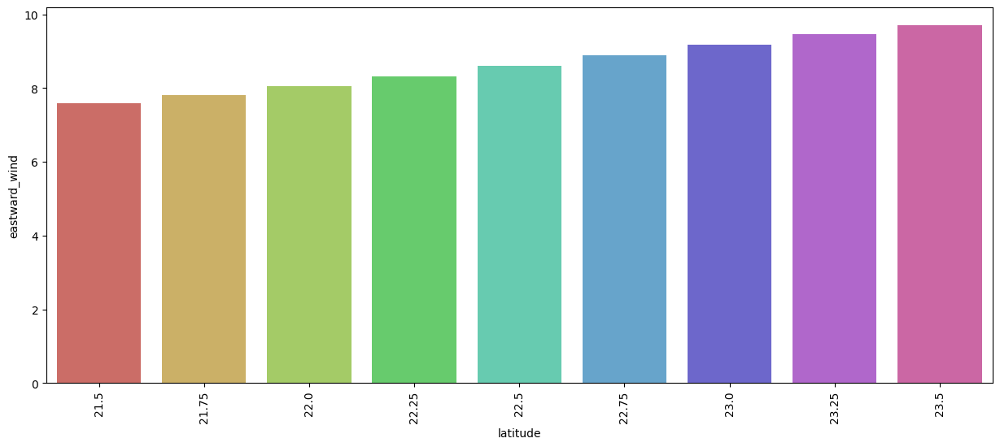

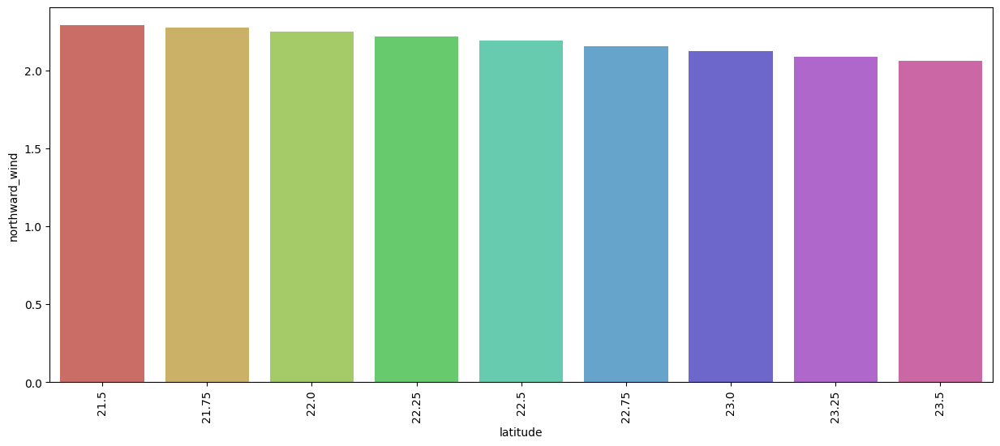

In [44]:
for i in categorical:
    for j in continuous:
        plt.figure(figsize=(15,6))
        sns.barplot(x = i, y = j, data = df, errorbar = None, palette='hls')
        plt.xticks(rotation = 90)
        plt.show()

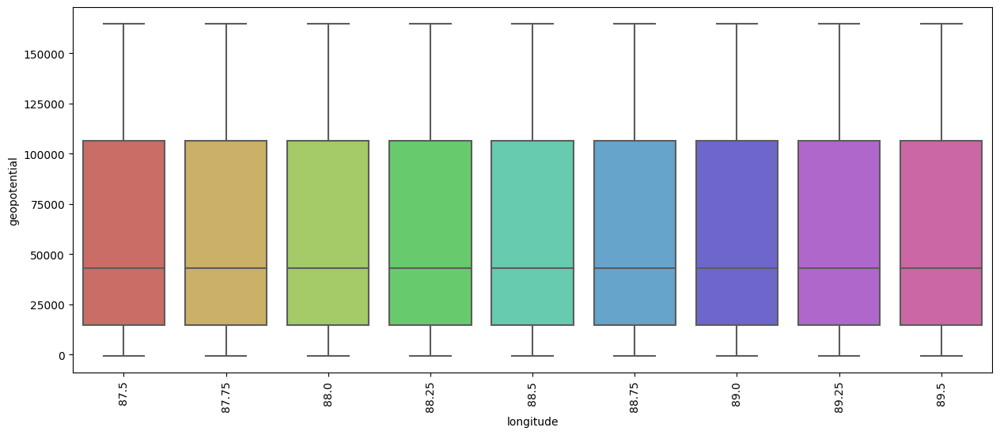

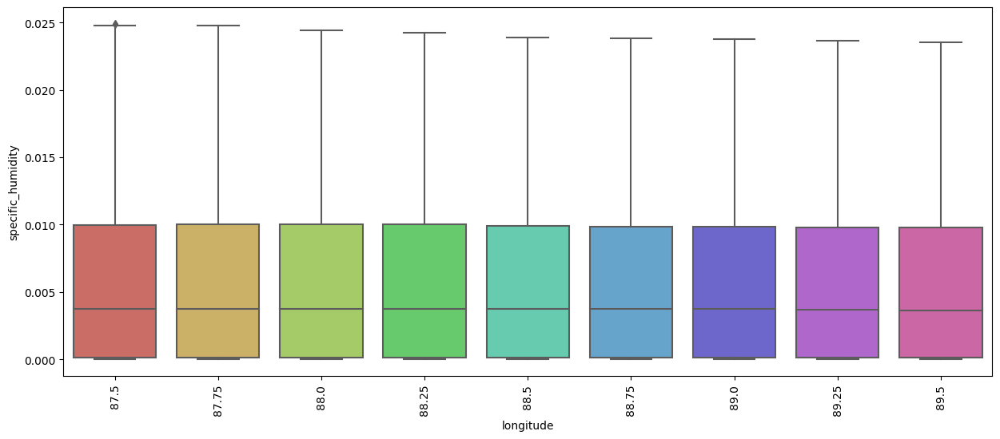

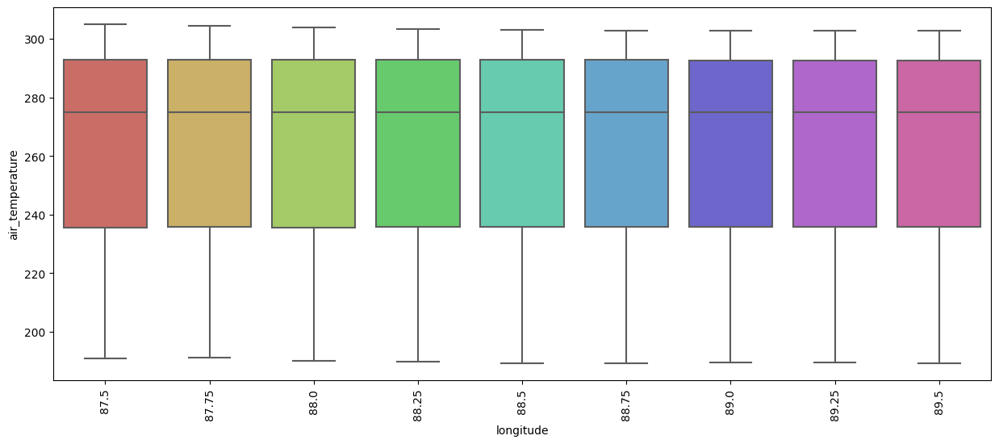

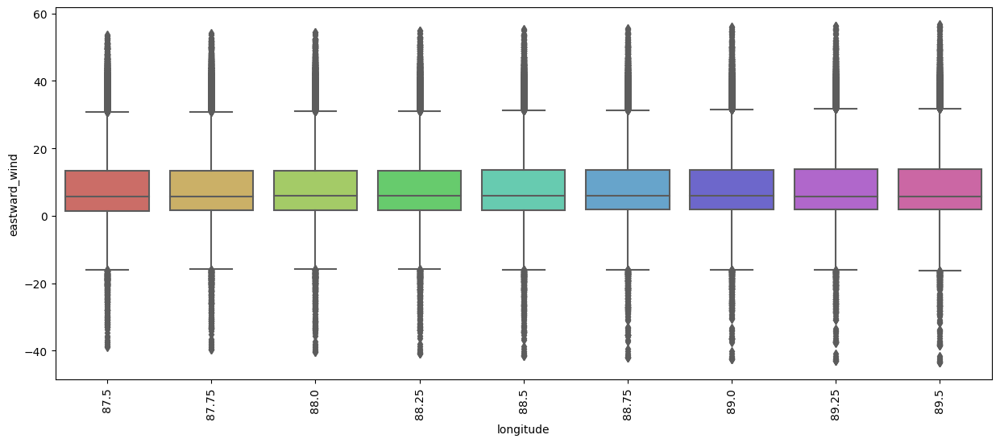

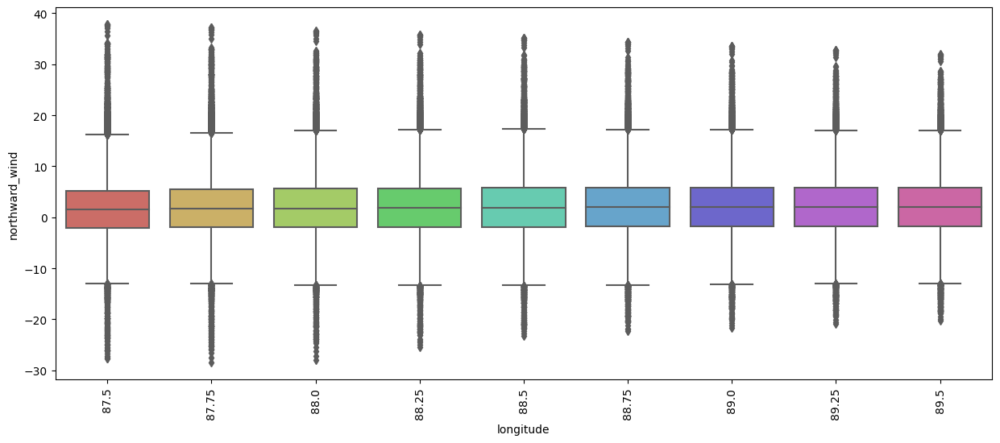

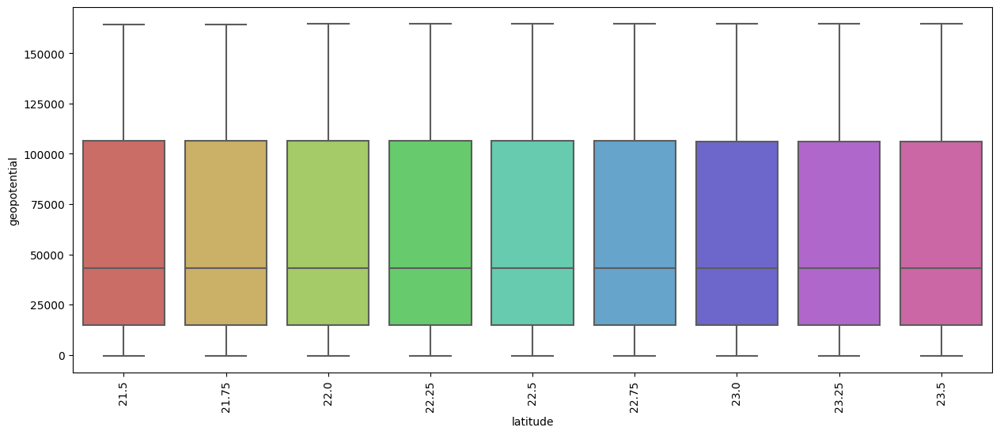

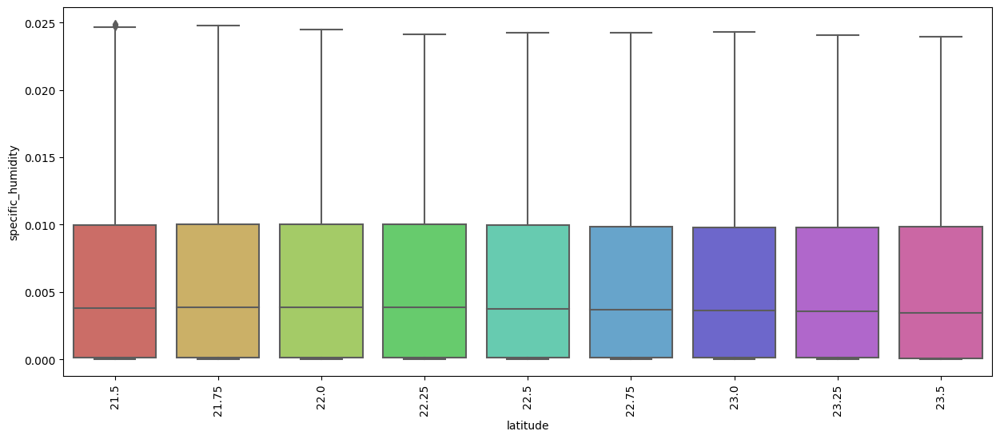

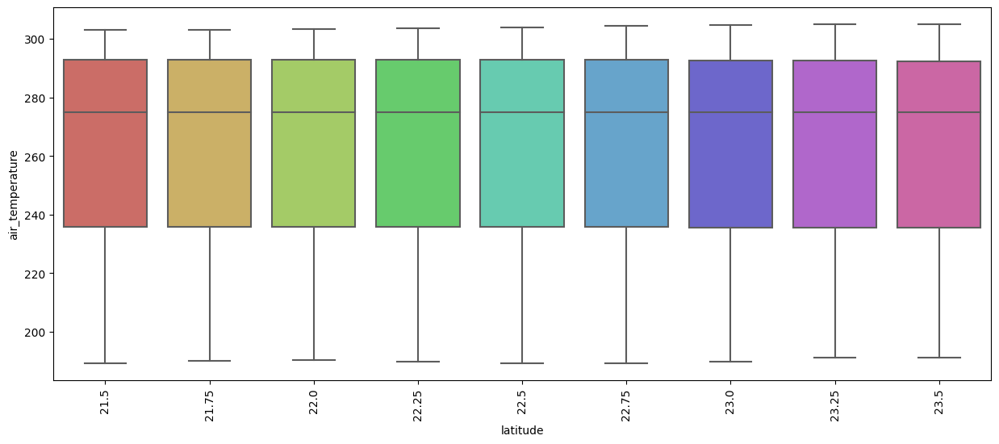

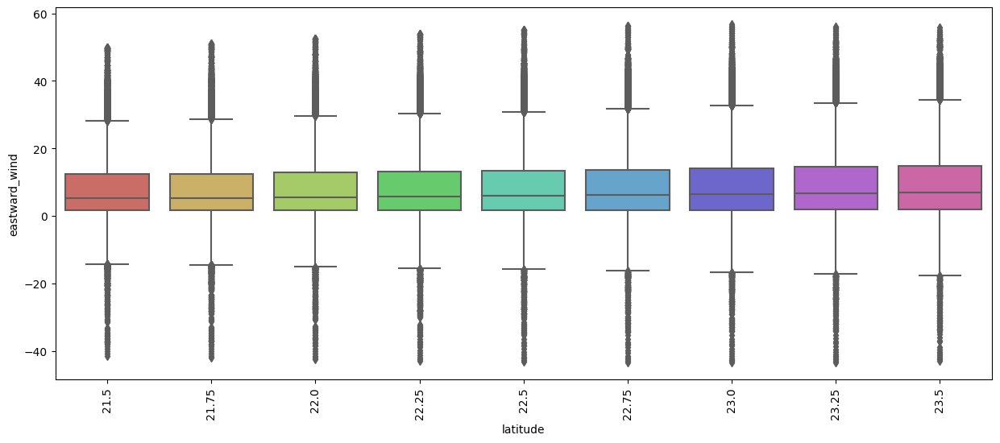

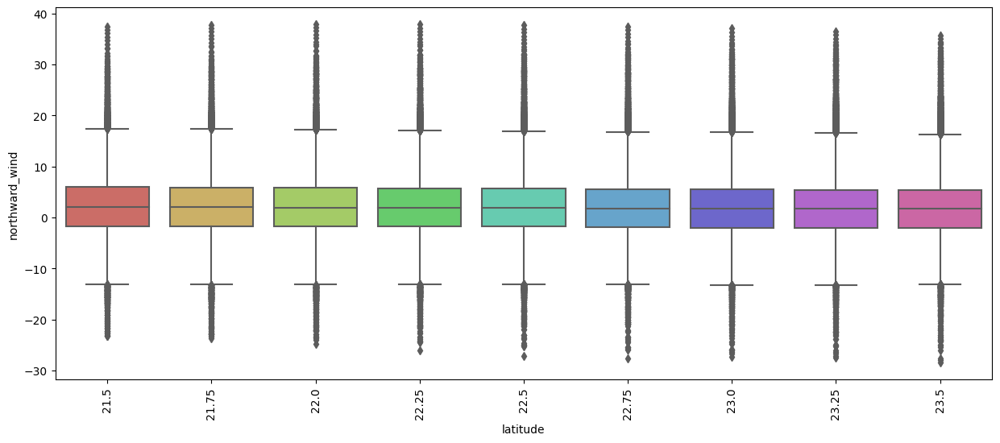

In [45]:
for i in categorical:
    for j in continuous:
        plt.figure(figsize=(15,6))
        sns.boxplot(x = i, y = j, data = df, palette='hls')
        plt.xticks(rotation = 90)
        plt.show()

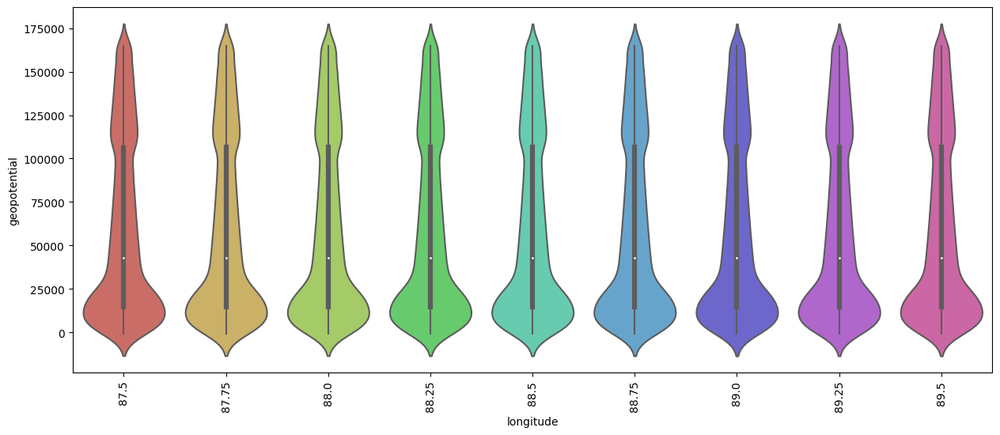

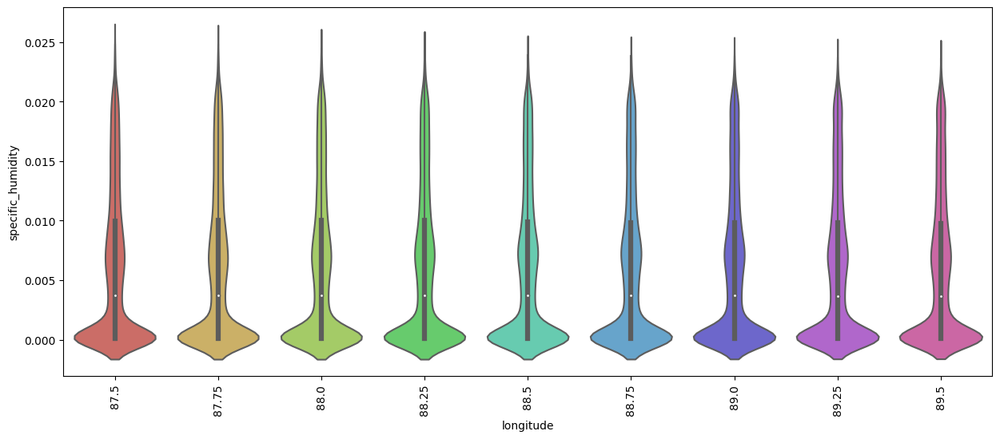

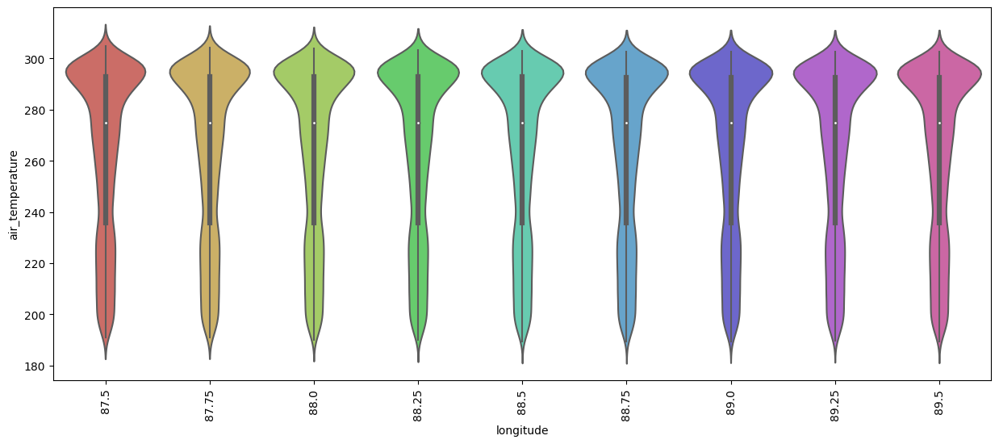

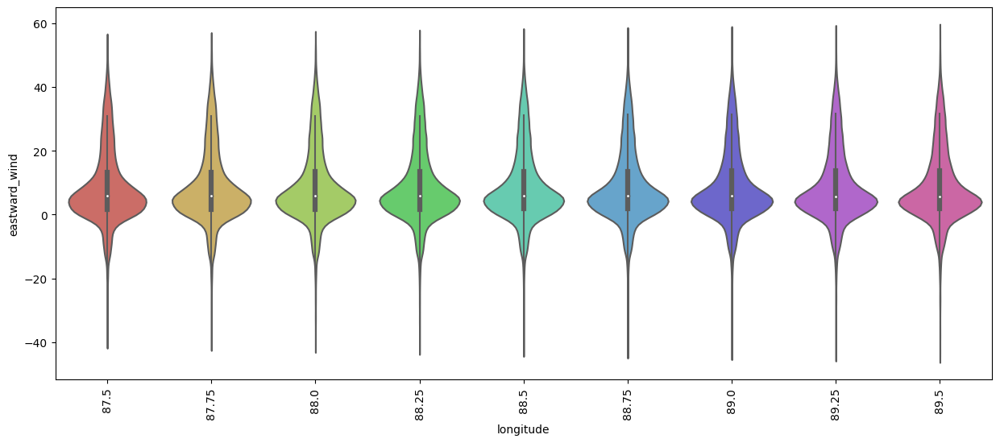

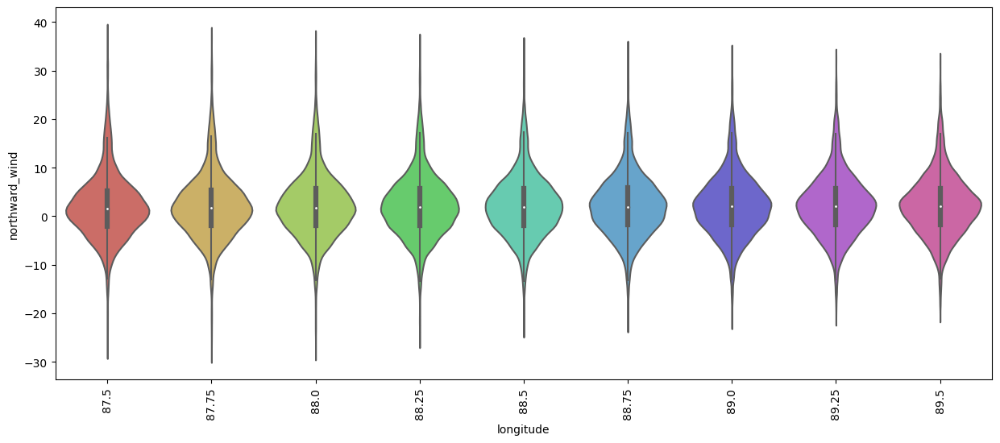

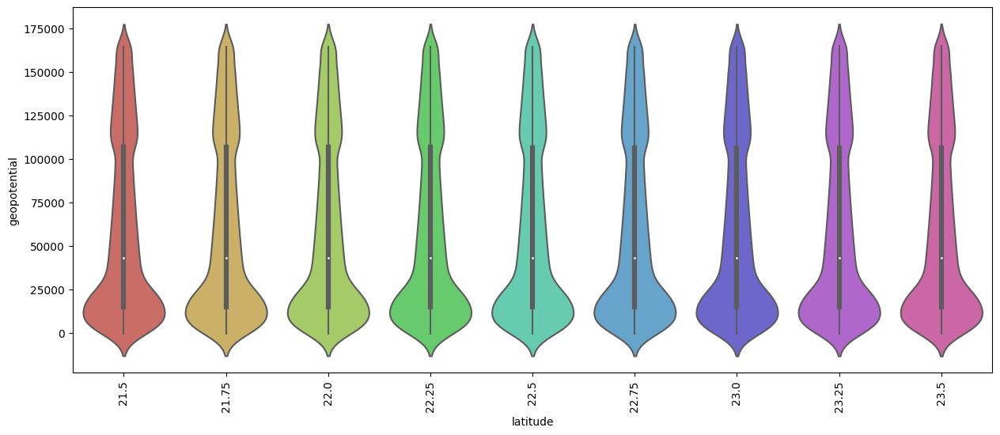

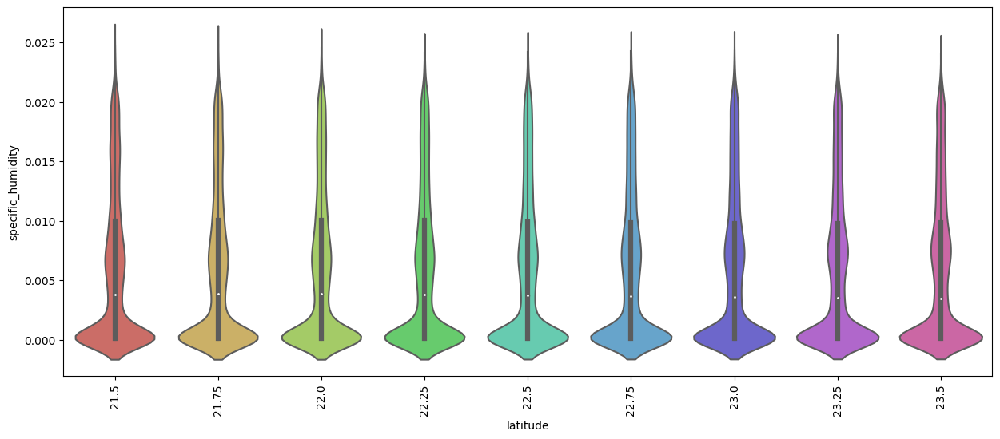

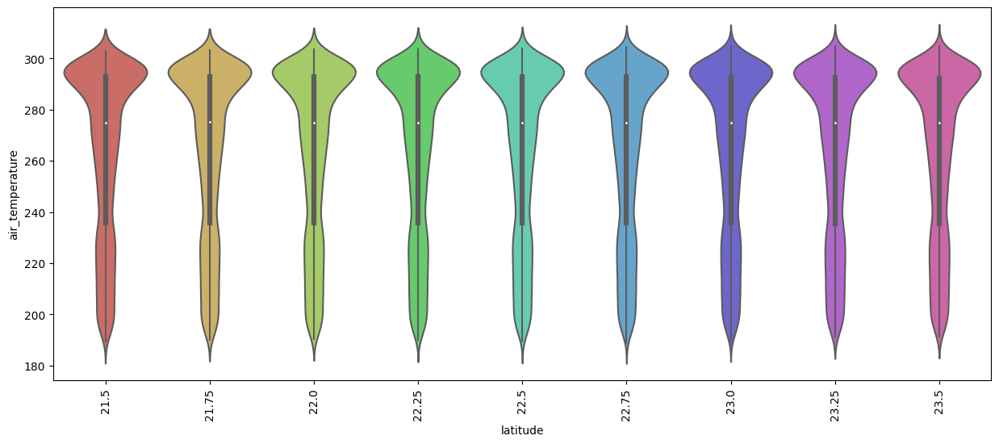

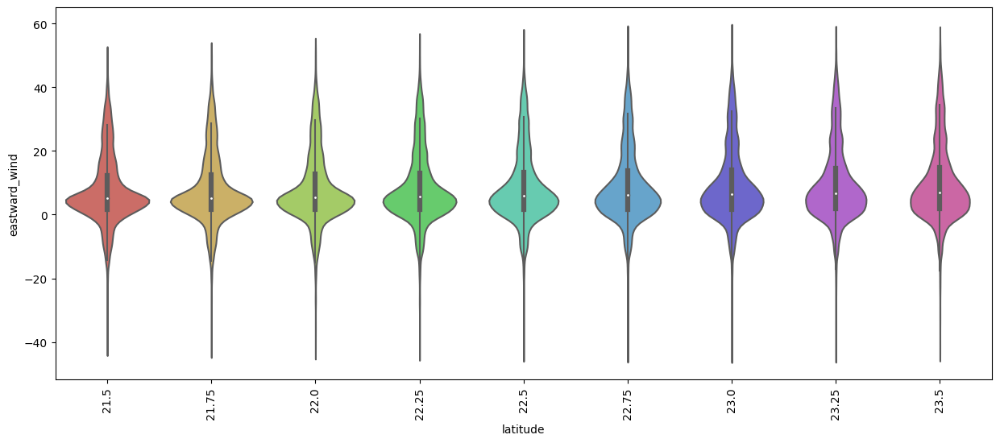

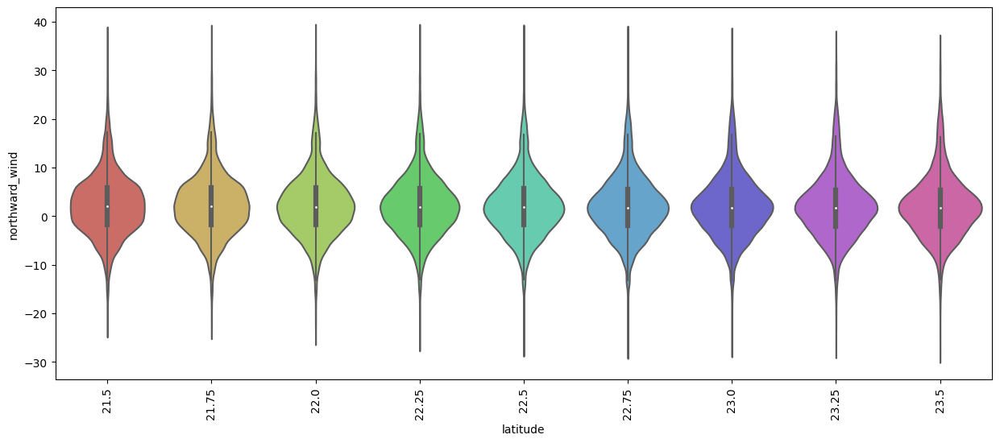

In [46]:
for i in categorical:
    for j in continuous:
        plt.figure(figsize=(15,6))
        sns.violinplot(x = i, y = j, data = df, palette='hls')
        plt.xticks(rotation = 90)
        plt.show()

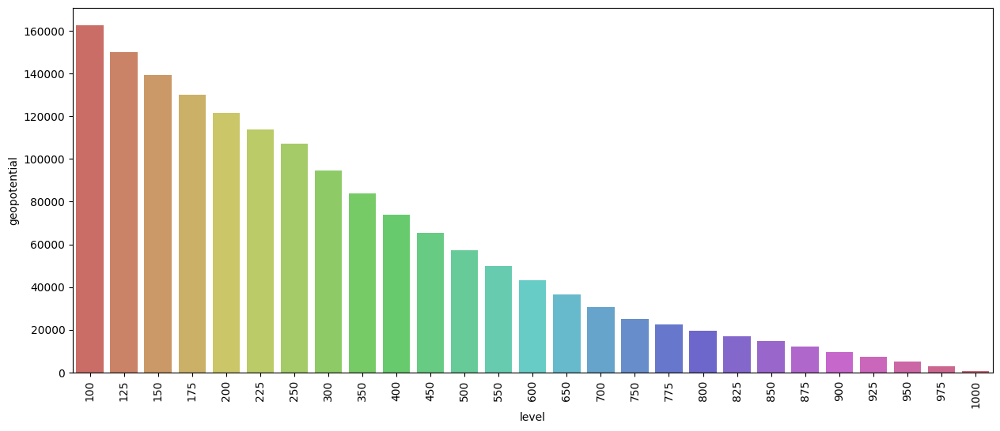

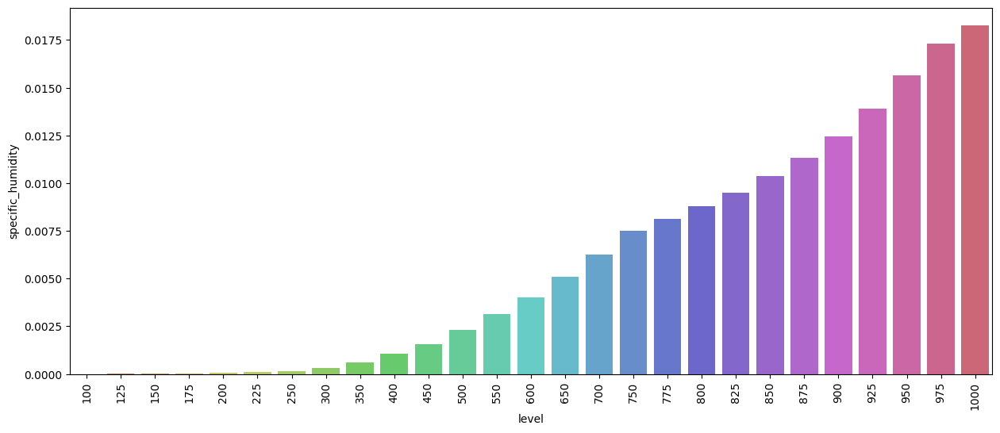

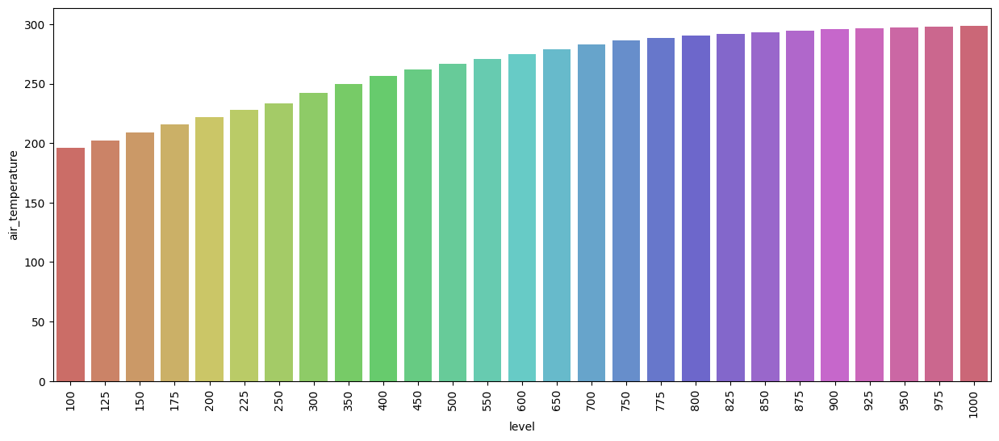

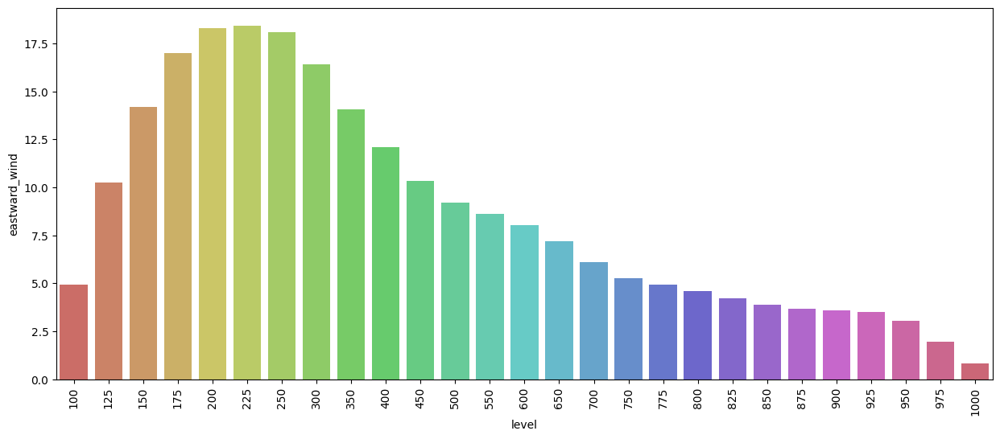

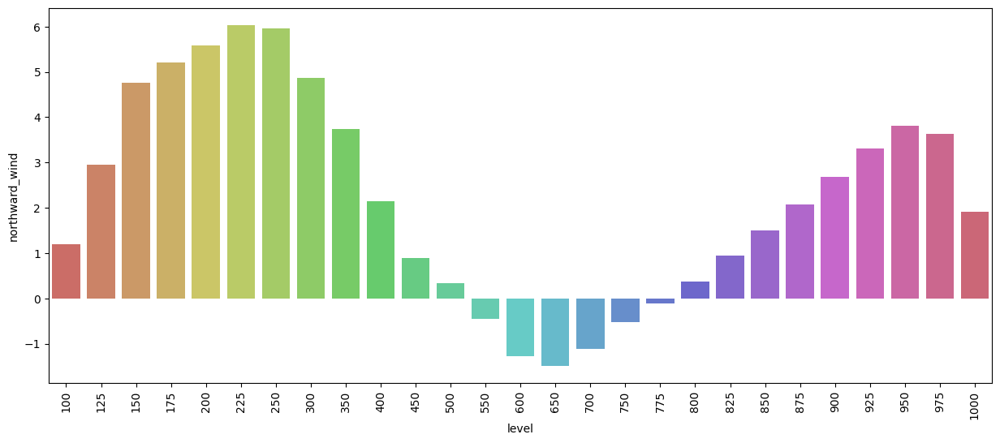

In [48]:
for i in discrete:
    for j in continuous:
        plt.figure(figsize=(15,6))
        sns.barplot(x = i, y = j, data = df, errorbar = None, palette='hls')
        plt.xticks(rotation = 90)
        plt.show()

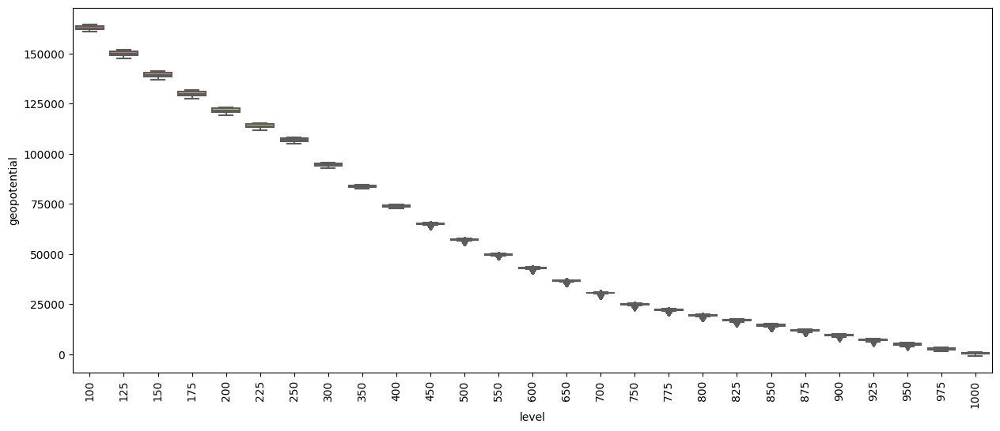

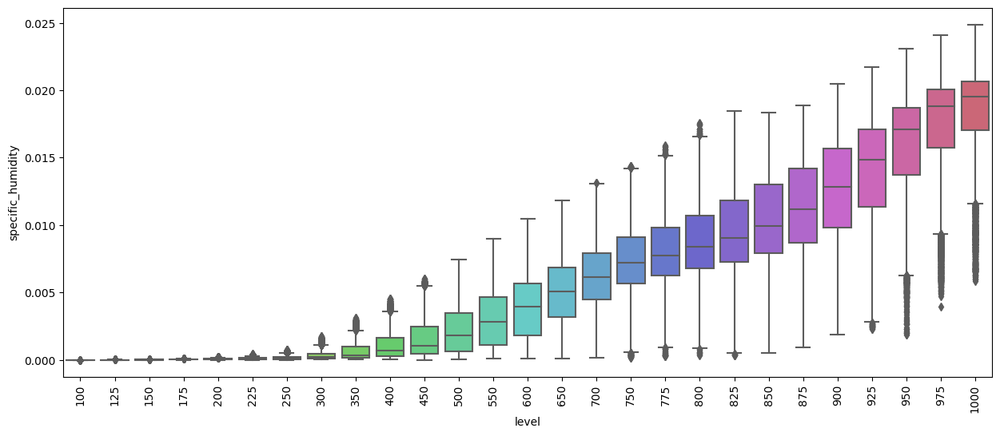

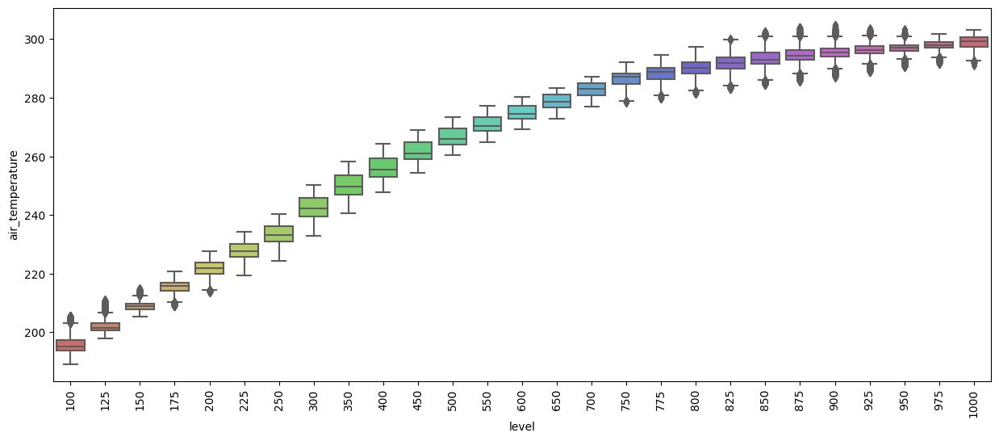

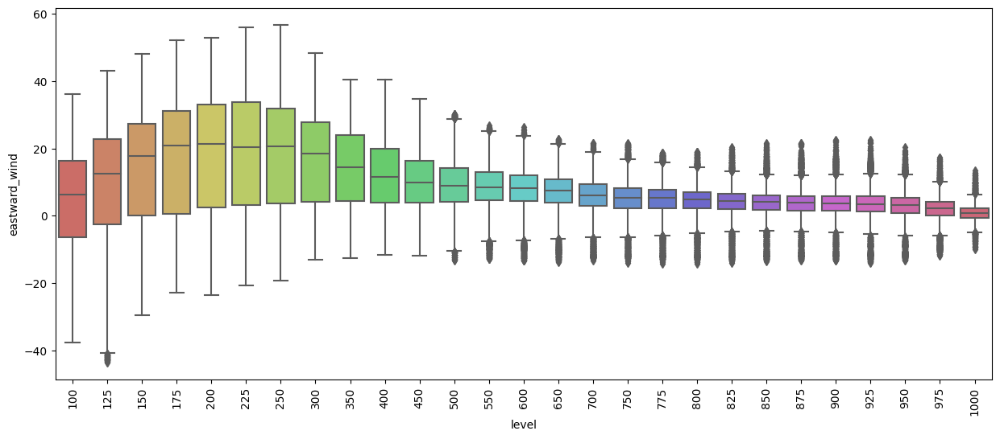

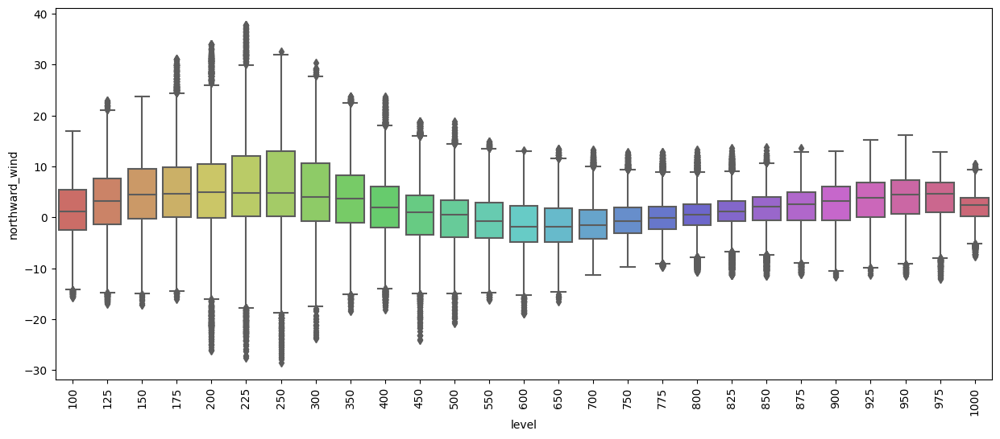

In [49]:
for i in discrete:
    for j in continuous:
        plt.figure(figsize=(15,6))
        sns.boxplot(x = i, y = j, data = df, palette='hls')
        plt.xticks(rotation = 90)
        plt.show()

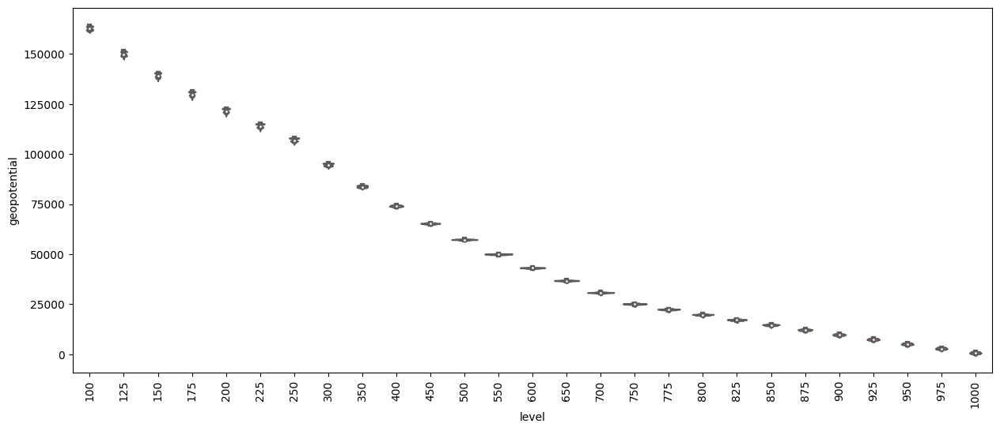

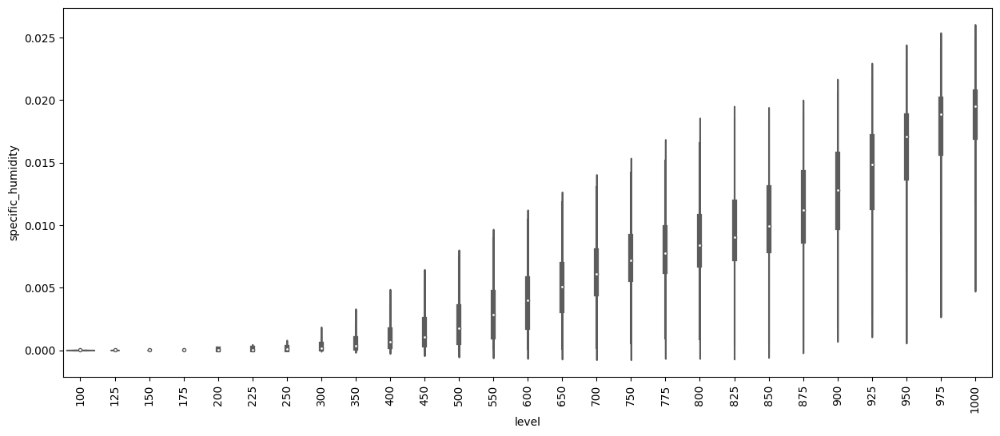

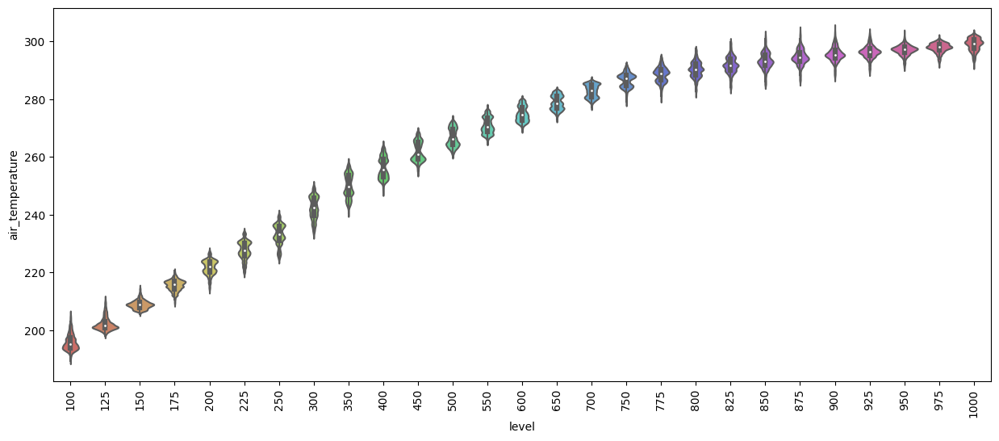

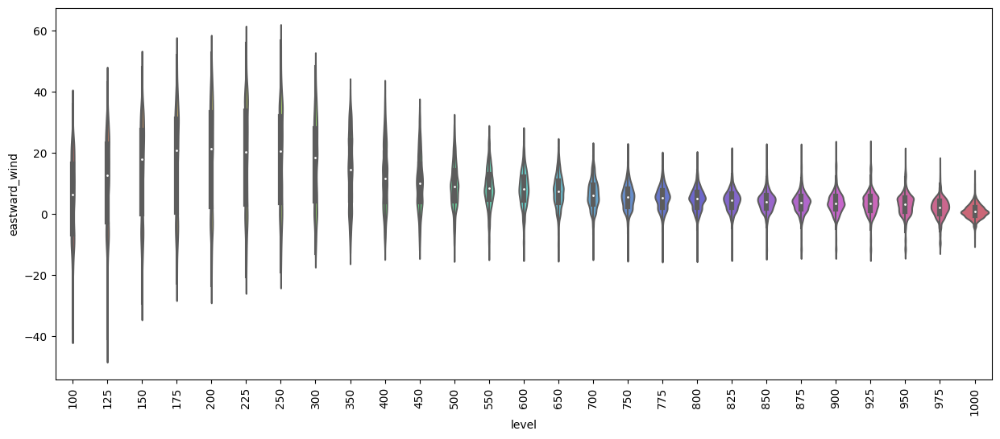

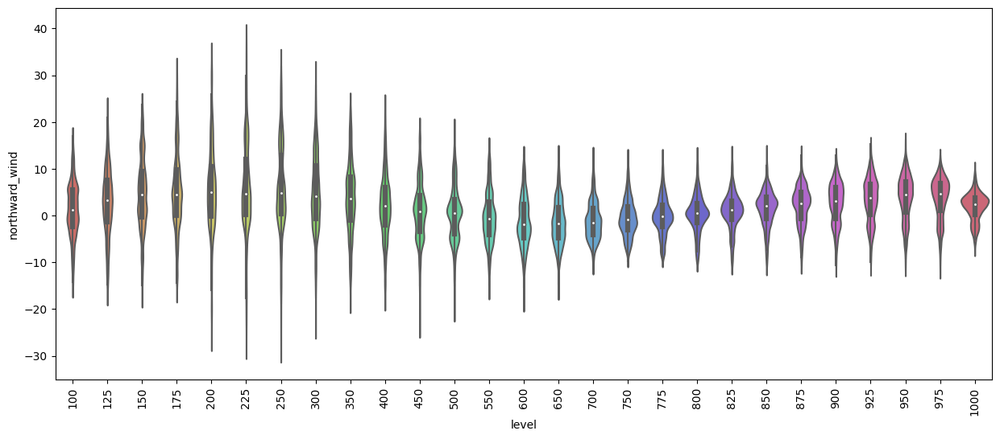

In [50]:
for i in discrete:
    for j in continuous:
        plt.figure(figsize=(15,6))
        sns.violinplot(x = i, y = j, data = df, palette='hls')
        plt.xticks(rotation = 90)
        plt.show()

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4098249624.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')


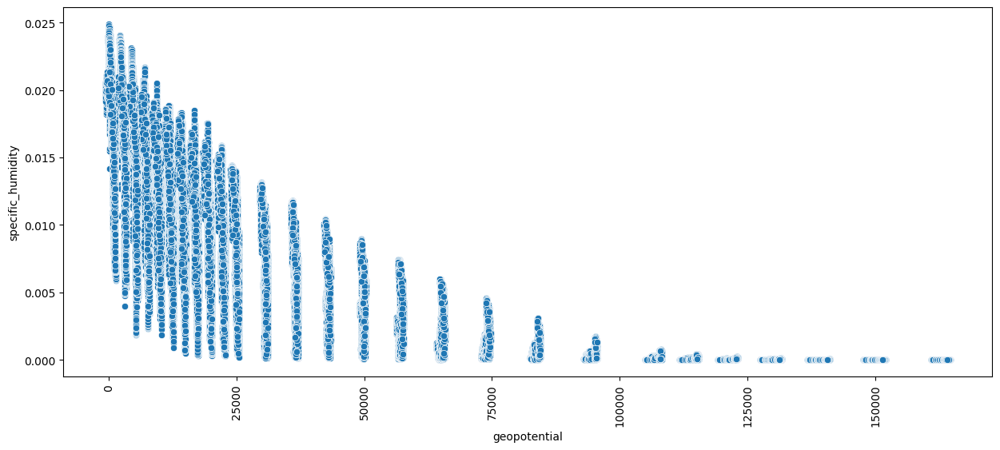

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4098249624.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')


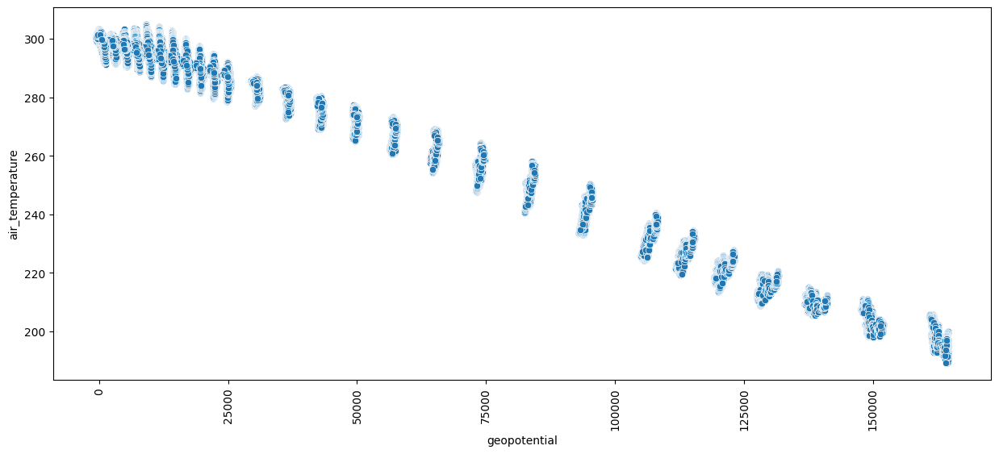

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4098249624.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')


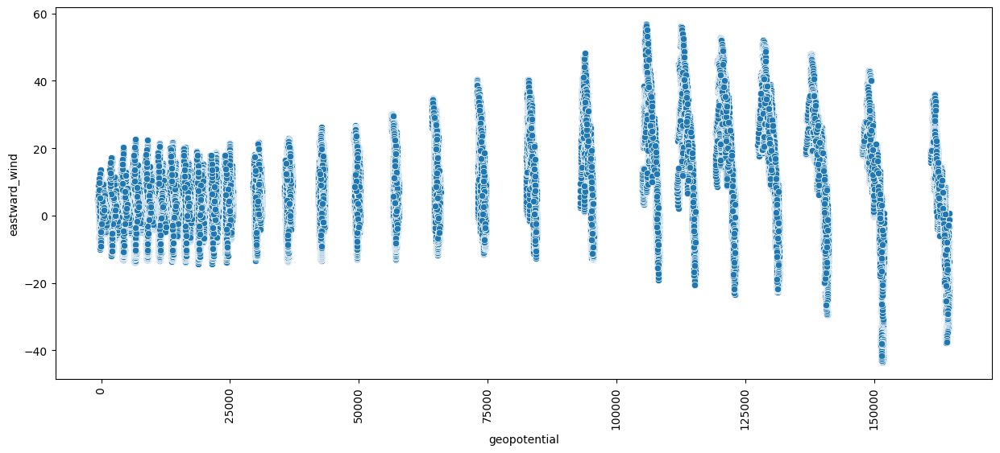

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4098249624.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')


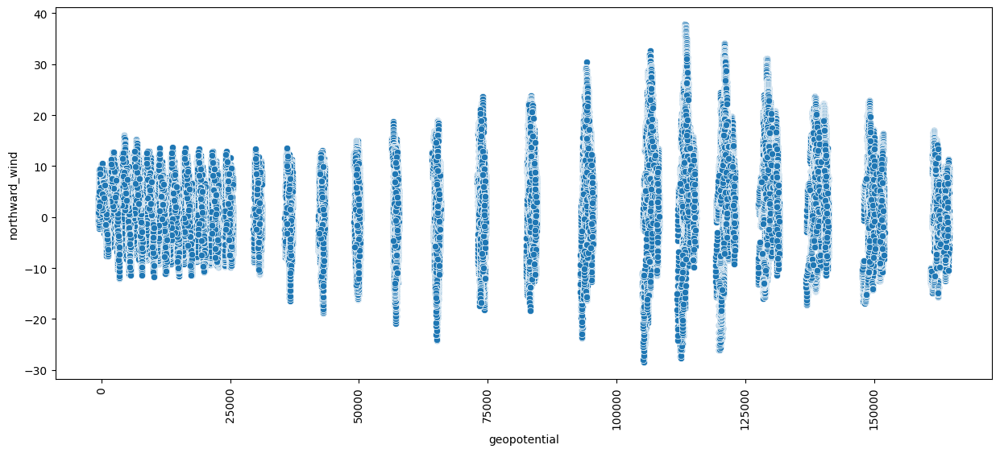

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4098249624.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')


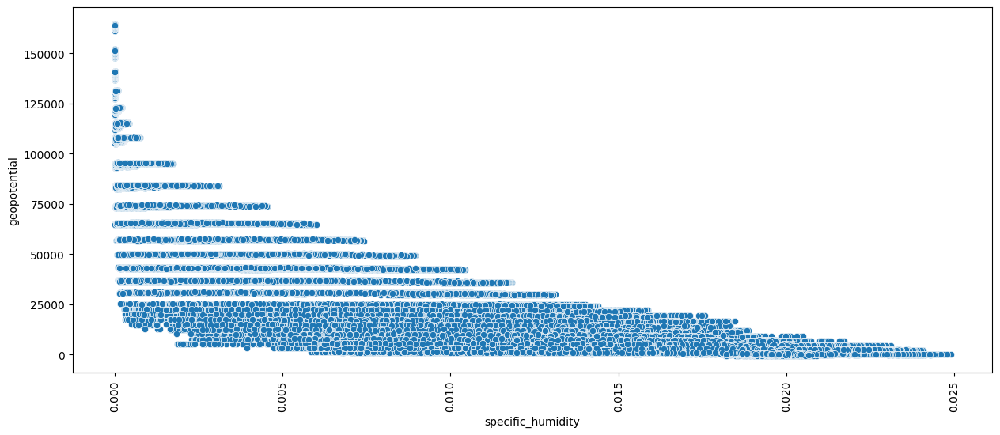

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4098249624.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')


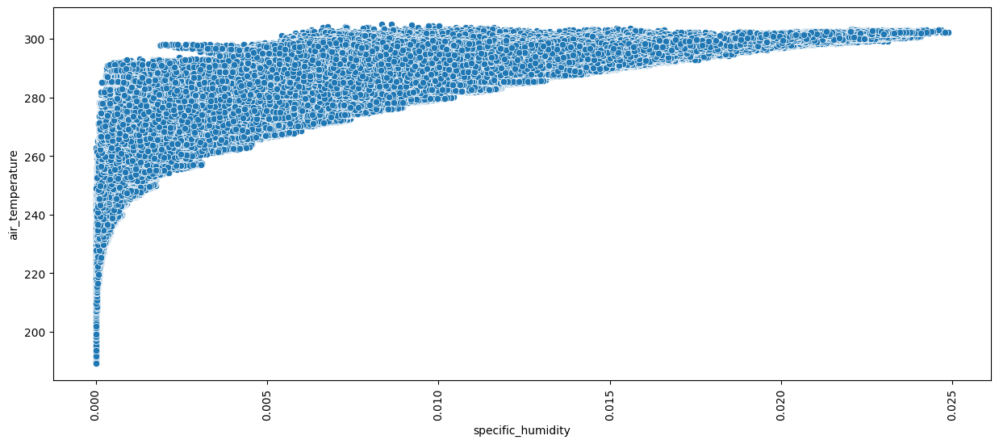

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4098249624.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')


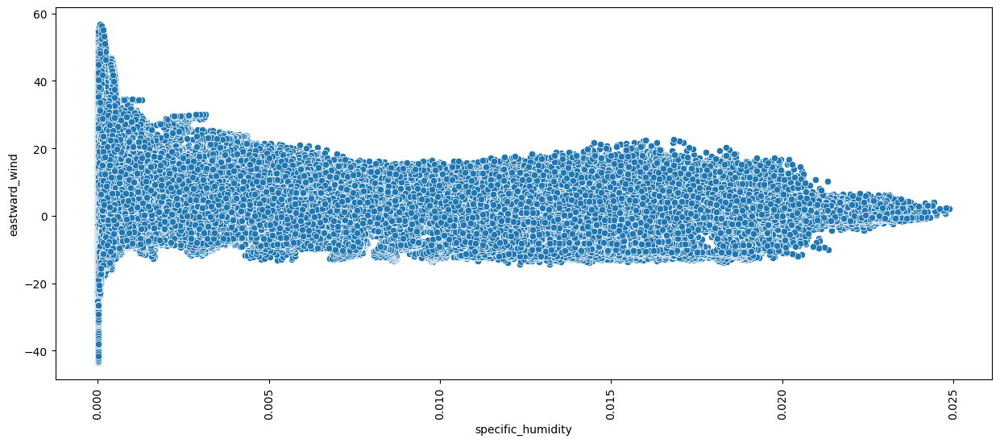

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4098249624.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')


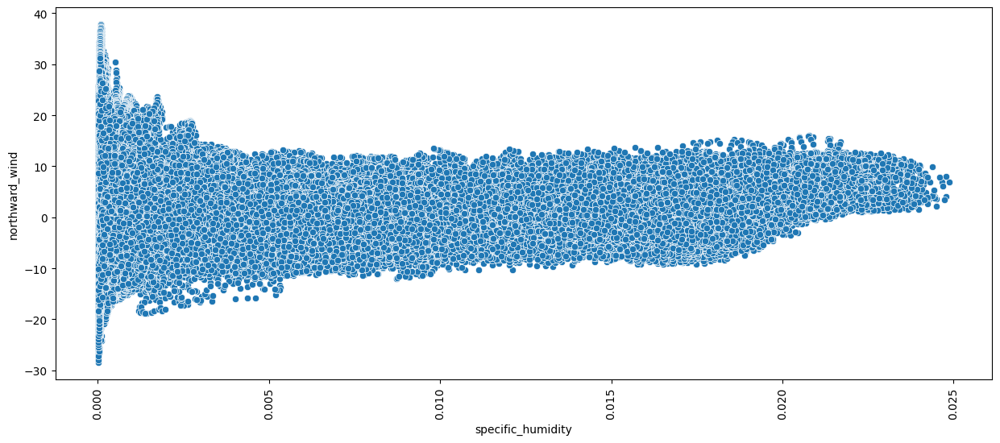

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4098249624.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')


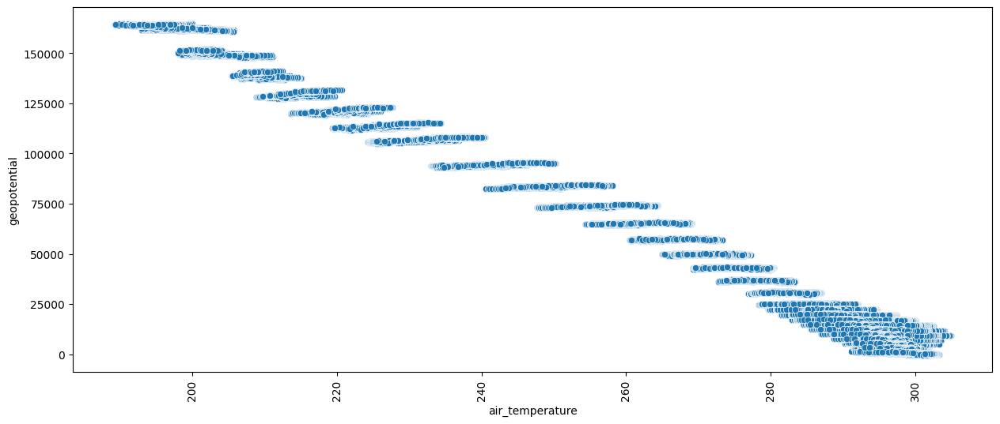

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4098249624.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')


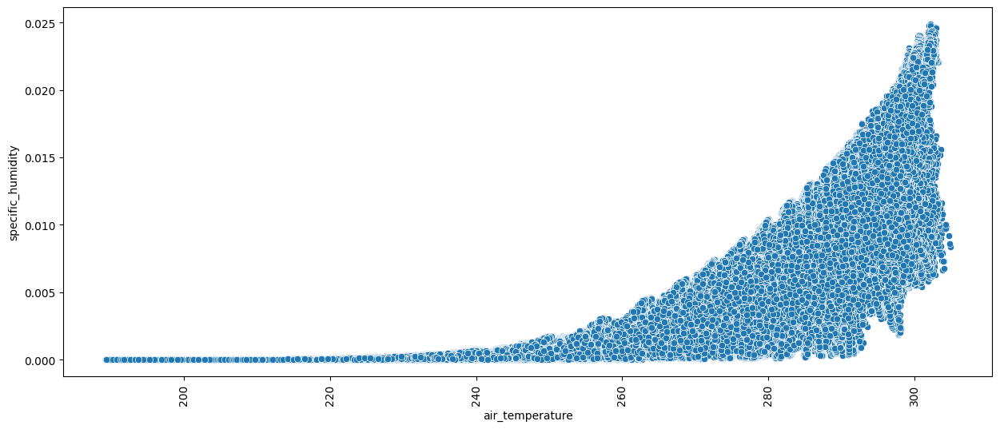

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4098249624.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')


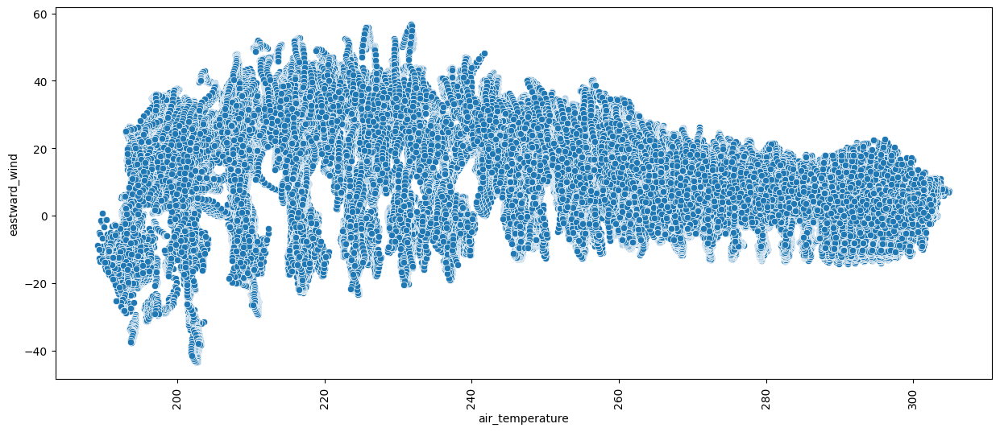

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4098249624.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')


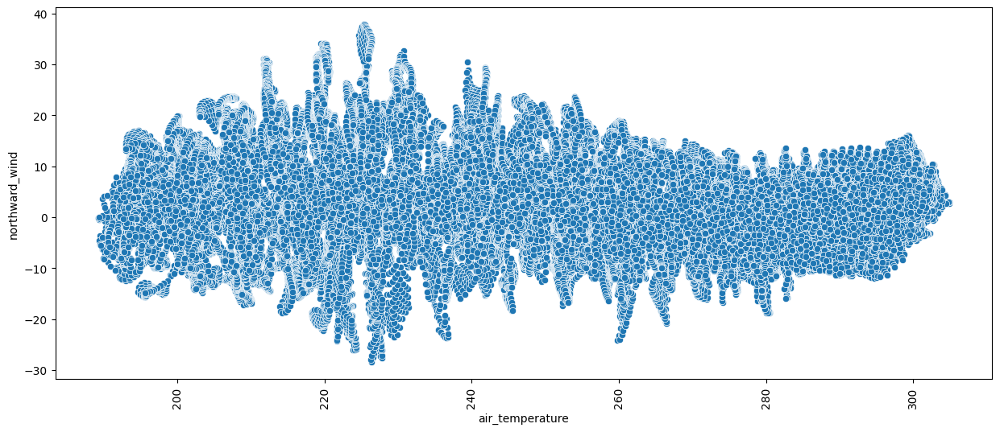

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4098249624.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')


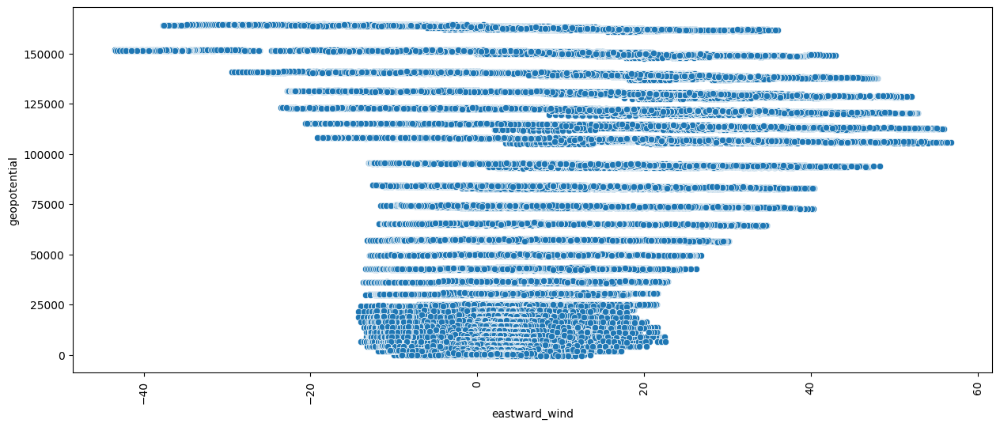

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4098249624.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')


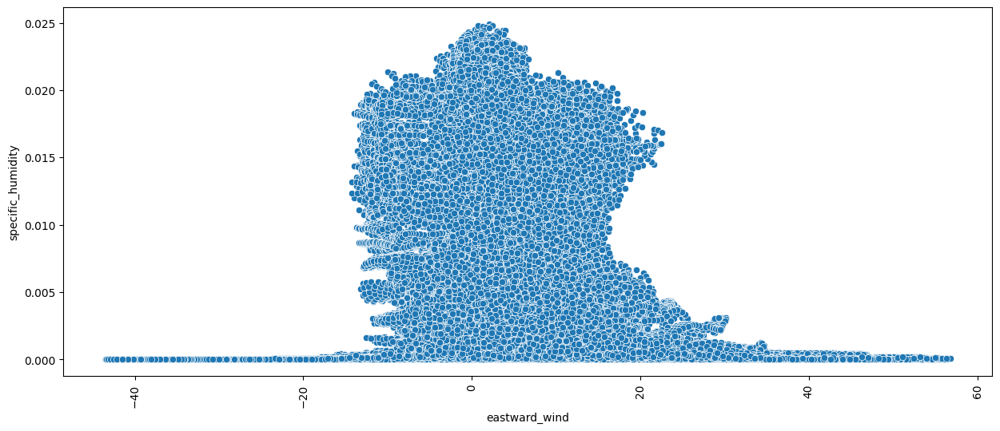

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4098249624.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')


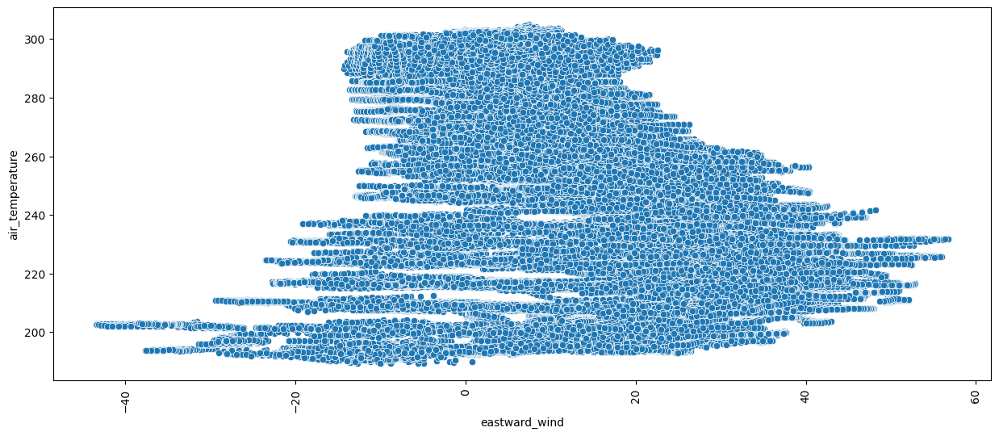

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4098249624.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')


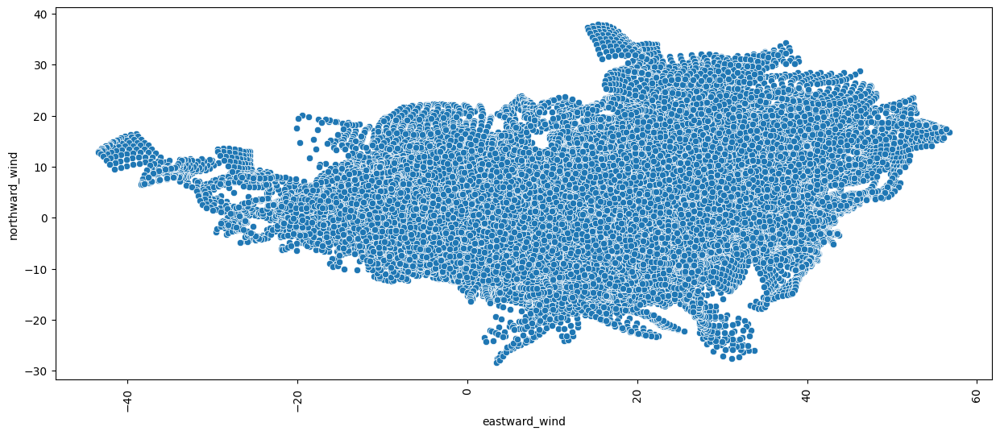

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4098249624.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')


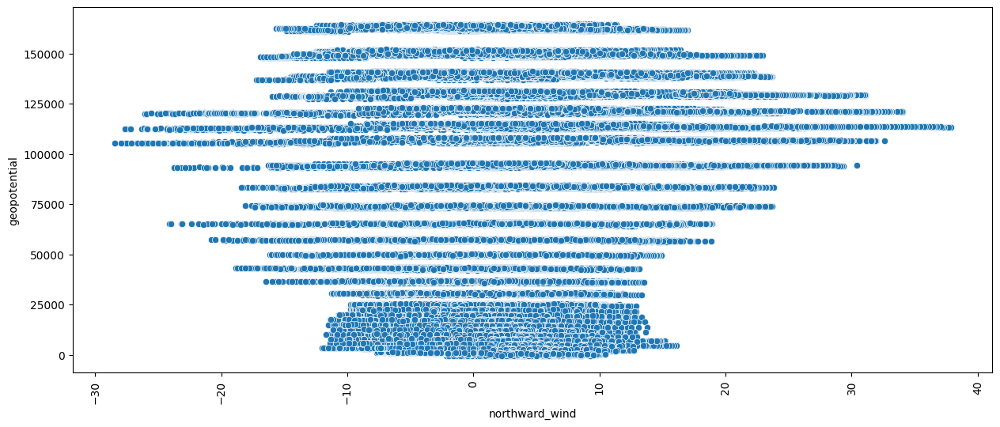

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4098249624.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')


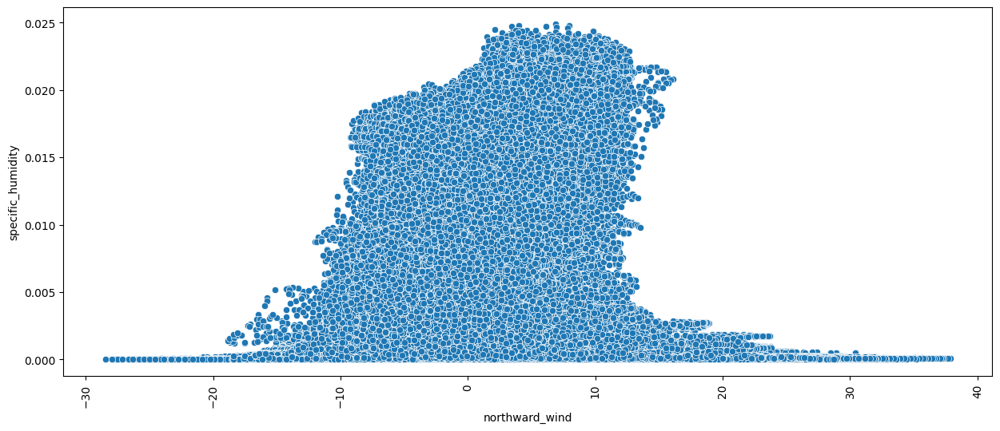

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4098249624.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')


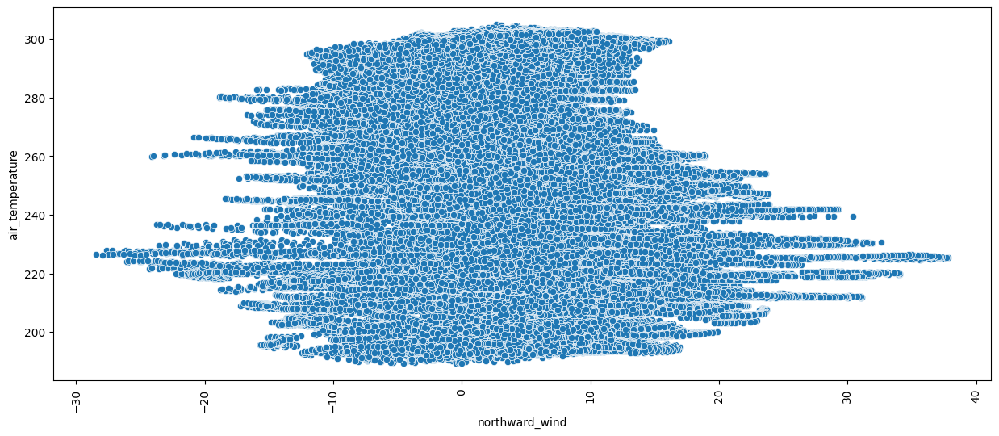

C:\Users\djadh\AppData\Local\Temp\ipykernel_11508\4098249624.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')


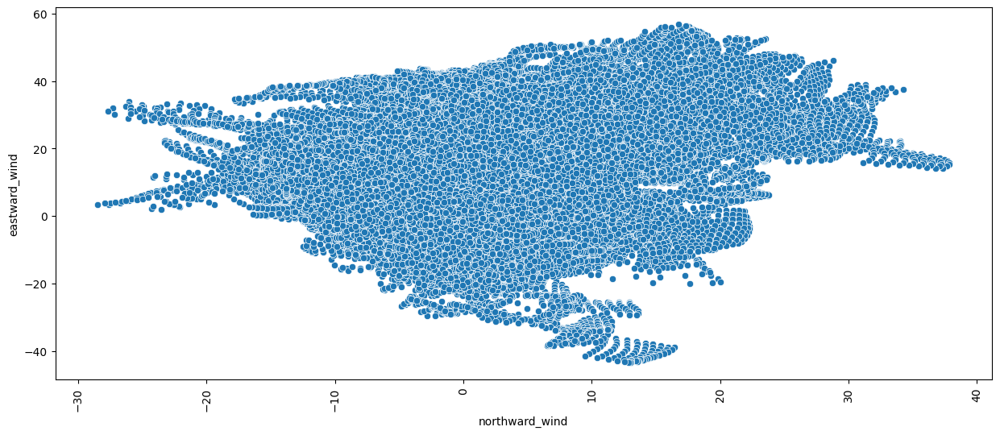

In [51]:
for i in continuous:
    for j in continuous:
        if i != j:
            plt.figure(figsize=(15,6))
            sns.scatterplot(x = df[i], y = df[j], data = df, palette = 'hls')
            plt.xticks(rotation = 90)
            plt.show()

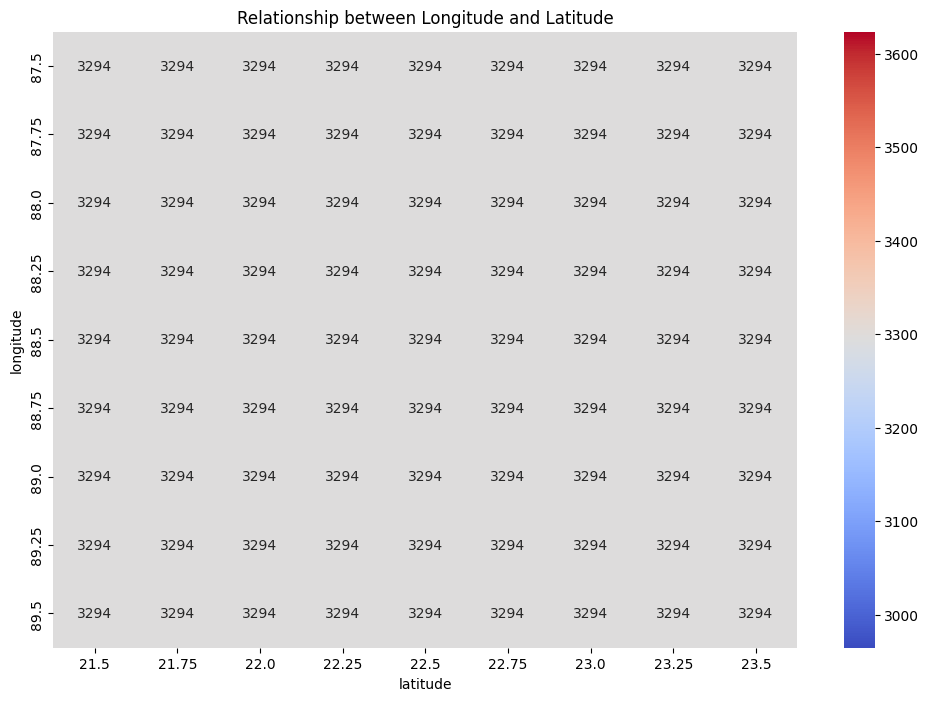

In [52]:
# Assuming 'longitude' and 'latitude' are your features of interest
location_relation = pd.crosstab(df['longitude'], df['latitude'])
plt.figure(figsize=(12, 8))
sns.heatmap(location_relation, annot=True, cmap='coolwarm', fmt='d')
plt.title('Relationship between Longitude and Latitude')
plt.show()


In [53]:
temperature_by_level = pd.crosstab(df['level'], df['air_temperature'])
plt.figure(figsize=(12, 8))
sns.heatmap(temperature_by_level, annot=True, cmap='coolwarm', fmt='d')
plt.title('Relationship between Level and Air Temperature')
plt.show()


KeyboardInterrupt: 

In [ ]:
geopotential_by_level = pd.crosstab(df['level'], df['geopotential'])
plt.figure(figsize=(12, 8))
sns.heatmap(geopotential_by_level, annot=True, cmap='coolwarm', fmt='d')
plt.title('Relationship between Level and Geopotential')
plt.show()


In [ ]:
continuous_features = ['geopotential', 'specific_humidity', 'air_temperature', 'eastward_wind', 'northward_wind']
plt.figure(figsize=(10, 8))
sns.heatmap(df[continuous_features].corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap for Continuous Features')
plt.show()


In [ ]:
df['time'] = pd.to_datetime(df['time'])
df.set_index('time', inplace=True)

plt.figure(figsize=(15, 8))
df['geopotential'].resample('D').sum().plot(title='Daily Total Geopotential')
plt.show()


In [8]:
import matplotlib.pyplot as plt

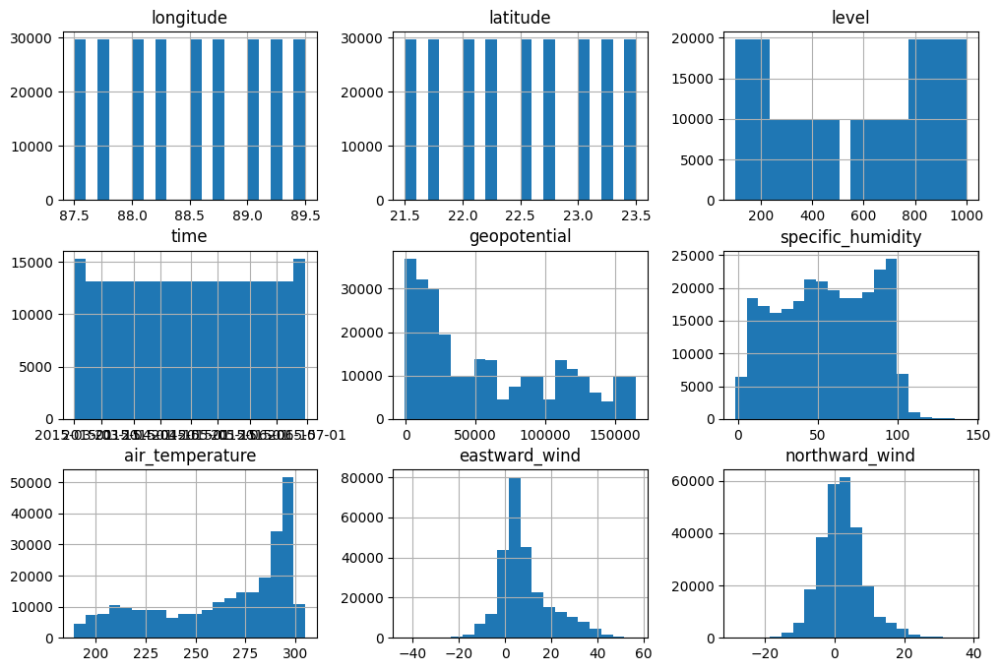

In [32]:
df.hist(figsize=(12, 8), bins=20)
plt.show()


Histograms for Numerical Variables:

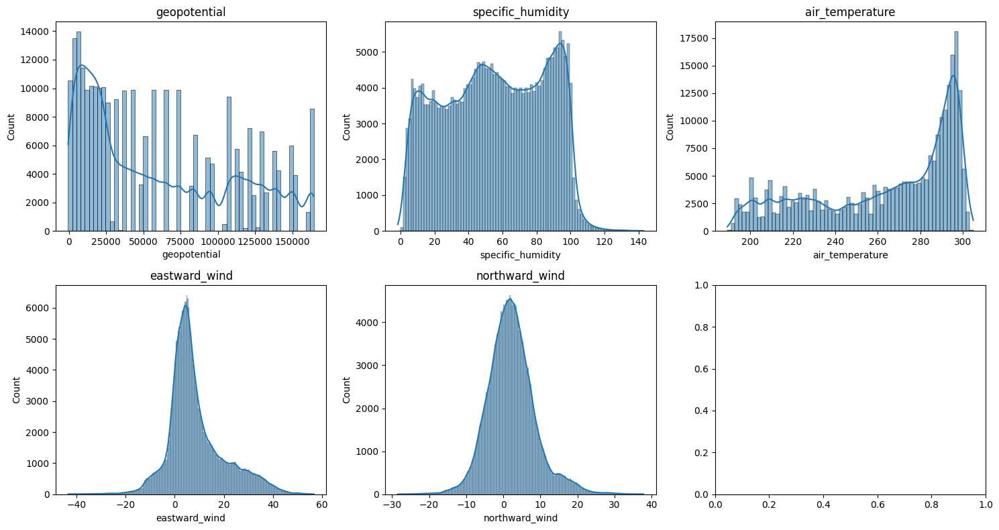

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up subplots for numerical variables
num_cols = ['geopotential', 'specific_humidity', 'air_temperature', 'eastward_wind', 'northward_wind']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 8))

# Plot histograms
for i, col in enumerate(num_cols):
    sns.histplot(df[col], ax=axes[i//3, i%3], kde=True)
    axes[i//3, i%3].set_title(col)

plt.tight_layout()
plt.show()


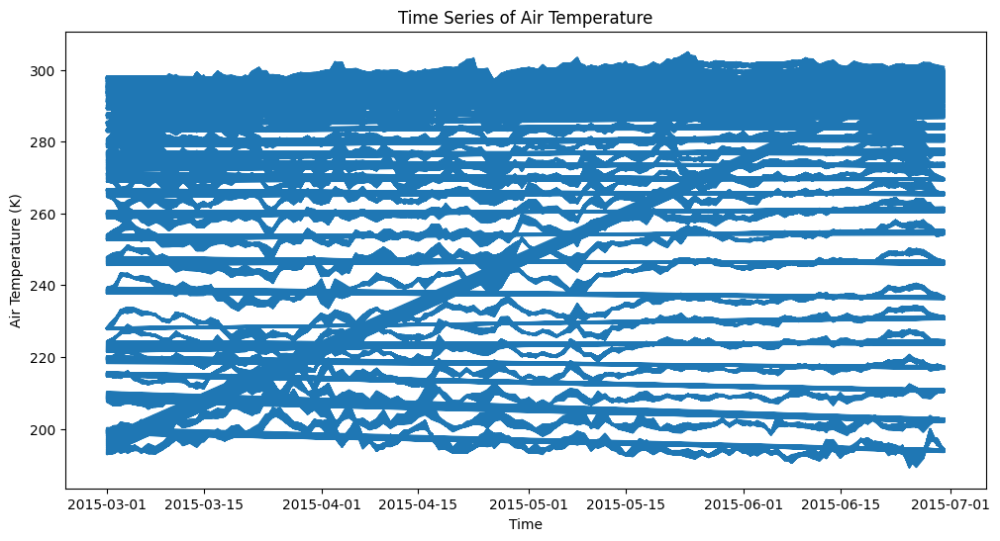

In [35]:
# Set the 'time' column as the index
df_time = df.set_index('time')

# Plot the time series of air temperature
plt.figure(figsize=(12, 6))
plt.plot(df_time['air_temperature'])
plt.title('Time Series of Air Temperature')
plt.xlabel('Time')
plt.ylabel('Air Temperature (K)')
plt.show()


<ipython-input-36-415af5e47e05>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


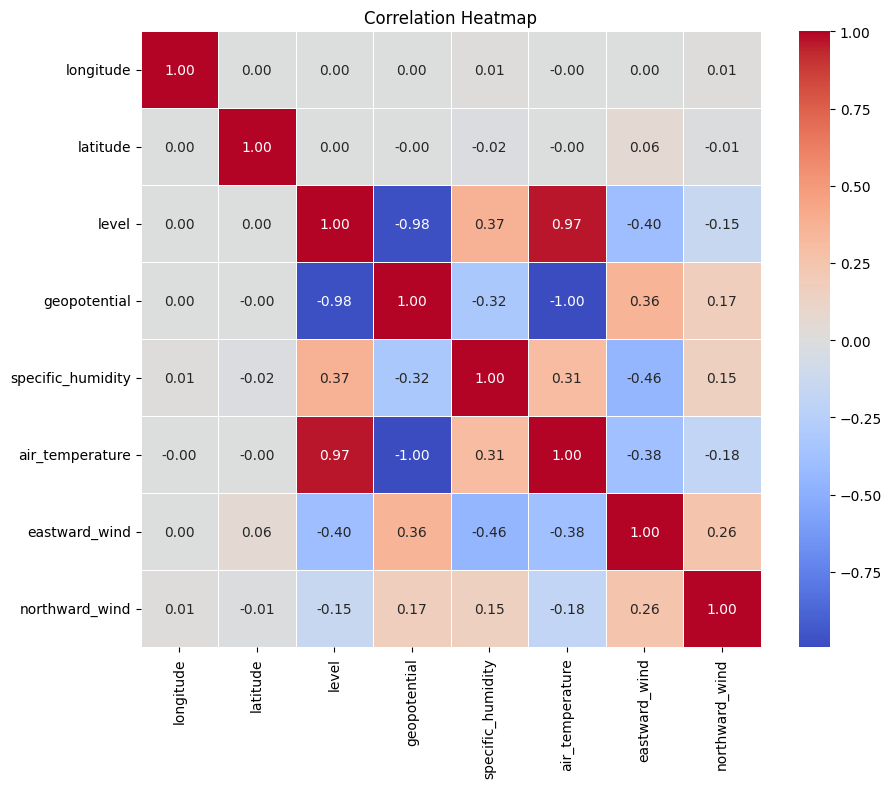

In [36]:
# Calculate correlation matrix
corr_matrix = df.corr()

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()

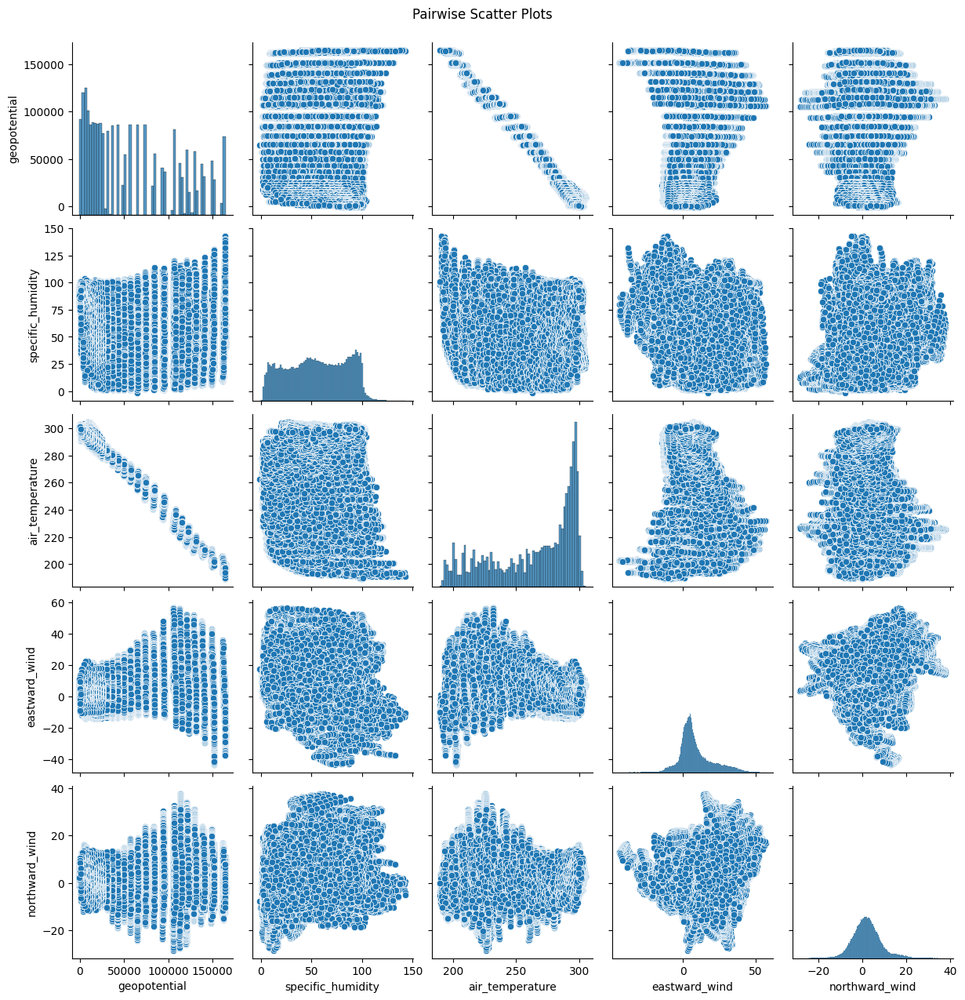

In [37]:
# Pairwise scatter plots for selected variables
sns.pairplot(df[['geopotential', 'specific_humidity', 'air_temperature', 'eastward_wind', 'northward_wind']])
plt.suptitle('Pairwise Scatter Plots', y=1.02)
plt.show()


# check later

In [ ]:
second_slice = slices[1]
print(second_slice)

<xarray.Dataset>
Dimensions:    (longitude: 161, latitude: 161, level: 27, time: 100)
Coordinates:
  * longitude  (longitude) float32 60.0 60.25 60.5 60.75 ... 99.5 99.75 100.0
  * latitude   (latitude) float32 40.0 39.75 39.5 39.25 ... 0.75 0.5 0.25 0.0
  * level      (level) int32 100 125 150 175 200 225 ... 900 925 950 975 1000
  * time       (time) datetime64[ns] 2015-06-09 2015-06-10 ... 2016-05-17
Data variables:
    z          (time, level, latitude, longitude) float32 ...
    q          (time, level, latitude, longitude) float32 ...
    t          (time, level, latitude, longitude) float32 ...
    u          (time, level, latitude, longitude) float32 ...
    v          (time, level, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2024-01-25 11:31:17 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...


EDA on first Slice

In [ ]:
third_slice = slices[2]
print(third_slice)

<xarray.Dataset>
Dimensions:    (longitude: 161, latitude: 161, level: 27, time: 100)
Coordinates:
  * longitude  (longitude) float32 60.0 60.25 60.5 60.75 ... 99.5 99.75 100.0
  * latitude   (latitude) float32 40.0 39.75 39.5 39.25 ... 0.75 0.5 0.25 0.0
  * level      (level) int32 100 125 150 175 200 225 ... 900 925 950 975 1000
  * time       (time) datetime64[ns] 2016-05-18 2016-05-19 ... 2017-04-25
Data variables:
    z          (time, level, latitude, longitude) float32 ...
    q          (time, level, latitude, longitude) float32 ...
    t          (time, level, latitude, longitude) float32 ...
    u          (time, level, latitude, longitude) float32 ...
    v          (time, level, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2024-01-25 11:31:17 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...


In [ ]:
import xarray as xr
import pandas as pd

# Open the netCDF dataset
ds = xr.open_dataset("reanalysis.nc")

# Get the total number of time steps in the dataset
total_time_steps = ds.sizes['time']

# Define the size of each slice
slice_size = 100

# Calculate the total number of slices
total_slices = total_time_steps // slice_size

# List to store slices
slices = []

# Loop through the dataset and create slices
for i in range(total_slices):
    start_idx = i * slice_size
    end_idx = (i + 1) * slice_size
    subset_ds = ds.isel(time=slice(start_idx, end_idx))
    slices.append(subset_ds)

# Handle any remaining data after the last complete slice
if total_time_steps % slice_size != 0:
    start_idx = total_slices * slice_size
    subset_ds = ds.isel(time=slice(start_idx, None))
    slices.append(subset_ds)

# Convert the first slice to pandas DataFrame
first_slice = slices[0].to_dataframe().reset_index()

# Rename the columns to match the actual variable names
column_mapping = {
    'geopotential': 'z',
    'specific_humidity': 'q',
    'air_temperature': 't',
    'eastward_wind': 'u',
    'northward_wind': 'v'
}

first_slice.rename(columns=column_mapping, inplace=True)

# Display the first slice DataFrame
print(first_slice.head())

# Perform EDA on the DataFrame
# ... your EDA code here ...


   longitude  latitude  level       time             z         q           t  \
0       60.0      40.0    100 2015-03-01  158600.87500  0.000003  213.238617   
1       60.0      40.0    100 2015-03-02  158221.18750  0.000003  217.556030   
2       60.0      40.0    100 2015-03-03  158028.75000  0.000003  217.018448   
3       60.0      40.0    100 2015-03-04  157571.03125  0.000003  216.932693   
4       60.0      40.0    100 2015-03-05  157295.37500  0.000003  216.512238   

           u         v  
0   7.824395 -7.322860  
1  10.296048 -0.330059  
2  18.361088  0.098188  
3  18.796730  0.286617  
4  17.322767 -0.360512  


## FIRST SLICE EDA

In [ ]:
# eda of FIrst slice
summary_stats = first_slice.describe()
print(summary_stats)


          longitude      latitude         level             z             q  \
count  6.998670e+07  6.998670e+07  6.998670e+07  6.998670e+07  6.998670e+07   
mean   8.000000e+01  2.000000e+01  5.685185e+02  5.891863e+04  4.162686e-03   
std    1.161895e+01  1.161895e+01  2.978777e+02  4.981332e+04  5.214615e-03   
min    6.000000e+01  0.000000e+00  1.000000e+02 -9.547344e+02 -7.980503e-06   
25%    7.000000e+01  1.000000e+01  2.500000e+02  1.487002e+04  8.828286e-05   
50%    8.000000e+01  2.000000e+01  6.000000e+02  4.315952e+04  1.723585e-03   
75%    9.000000e+01  3.000000e+01  8.500000e+02  1.054105e+05  6.608750e-03   
max    1.000000e+02  4.000000e+01  1.000000e+03  1.642988e+05  2.504903e-02   

                  t             u             v  
count  6.998670e+07  6.998670e+07  6.998670e+07  
mean   2.620351e+02  5.258980e+00  2.799590e-01  
std    3.276345e+01  1.191201e+01  5.694982e+00  
min    1.834267e+02 -4.477104e+01 -5.205852e+01  
25%    2.320666e+02 -1.353454e+00 -2.2

In [ ]:
data_types = first_slice.dtypes
missing_values = first_slice.isnull().sum()
print("Data Types:")
print(data_types)
print("\nMissing Values:")
print(missing_values)


Data Types:
longitude           float64
latitude            float64
level                 int64
time         datetime64[ns]
z                   float32
q                   float32
t                   float32
u                   float32
v                   float32
dtype: object

Missing Values:
longitude    0
latitude     0
level        0
time         0
z            0
q            0
t            0
u            0
v            0
dtype: int64


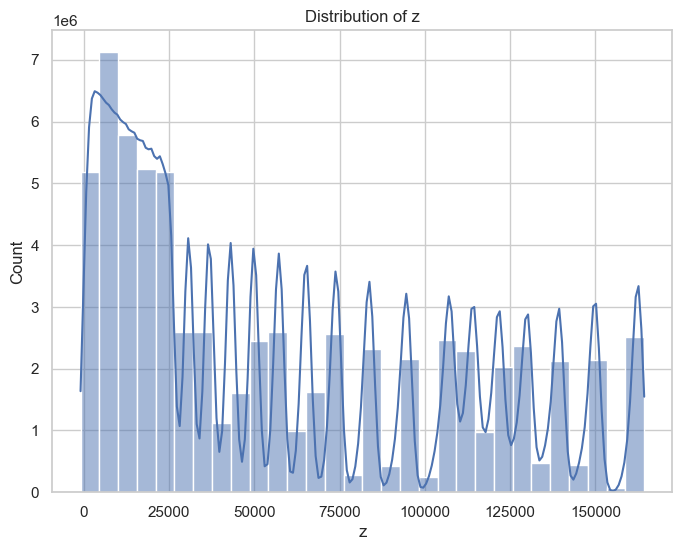

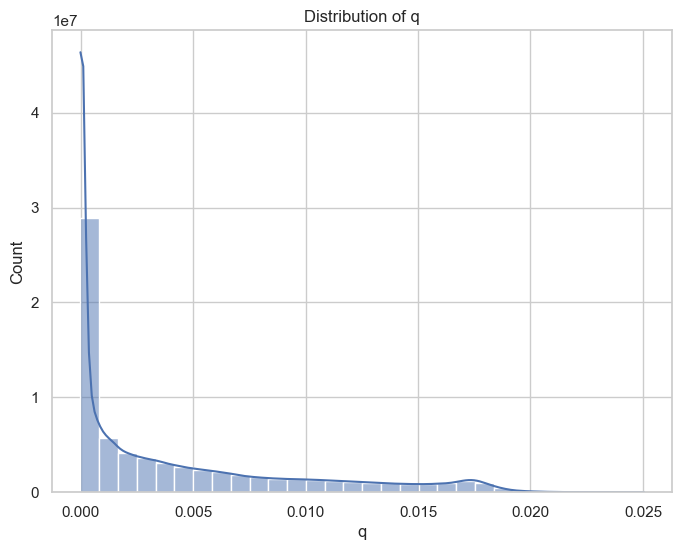

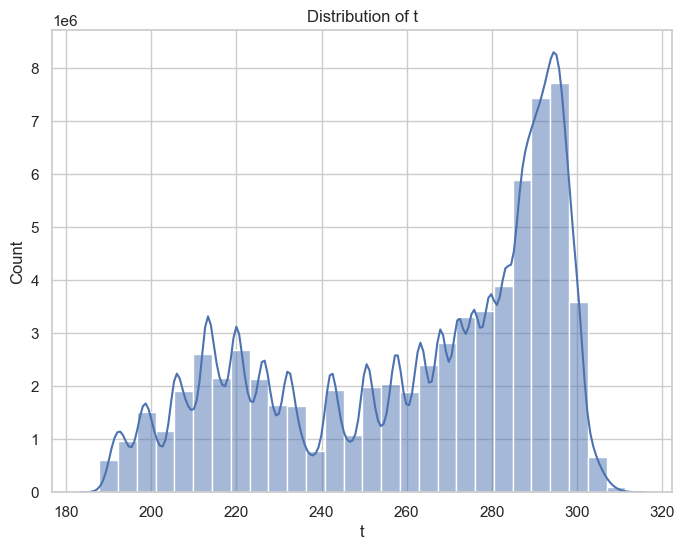

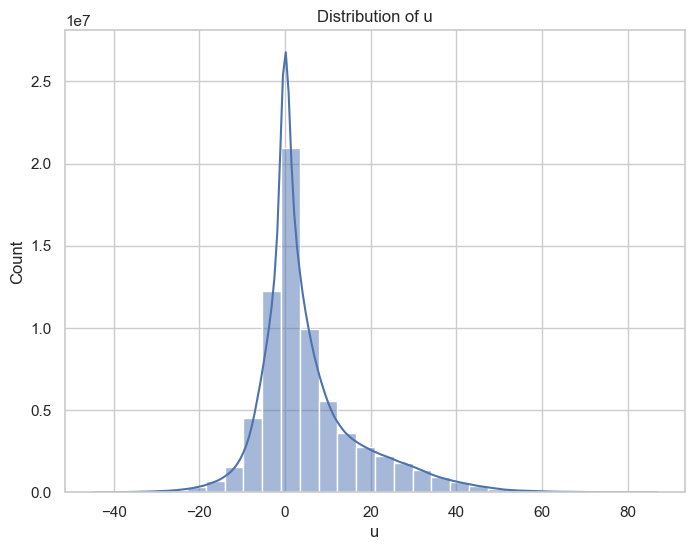

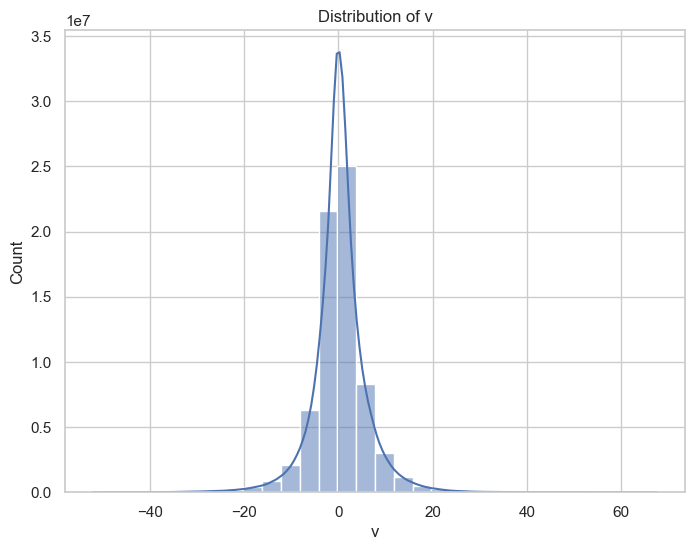

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set seaborn style
sns.set(style="whitegrid")

# Plot histograms for numerical columns
numerical_columns = ['z', 'q', 't', 'u', 'v']
for column in numerical_columns:
    plt.figure(figsize=(8, 6))
    sns.histplot(data=first_slice, x=column, kde=True, bins=30)
    plt.title(f'Distribution of {column}')
    plt.show()


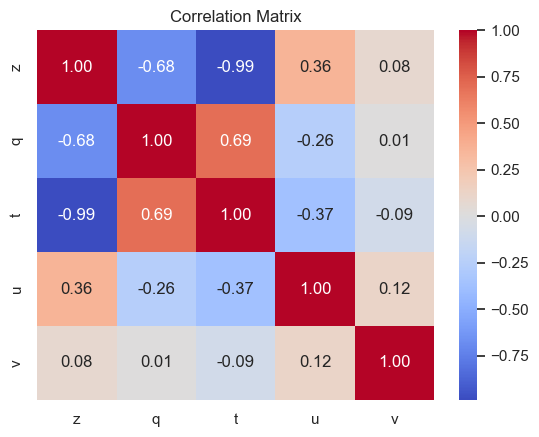

In [ ]:
correlation_matrix = first_slice[numerical_columns].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()


In [ ]:
second_slice = slices[1].to_dataframe().reset_index()

MemoryError: Unable to allocate 534. MiB for an array with shape (69986700,) and data type float64